In [20]:
# CHECK LIST
# Report Net monetary benefit [√]
# Relative mortality reduction [√]
# Factor consumption ratio [√]
# Report Incremental cost effectiveness ratio [√]
# Report quality adjusted life year [√]
# Report annual bleeding rate [√]
# Report annual joint hemorrhages [√]

# Value to report:
# Tornado diagram [ ]
# Onset of arthropathy [ ]
# Arthropathy progression and delayed onset [ ]

# OPTIONAL
# prevented_death_per_1000_patients [ ]
# Relative annual bleeding rate reduction [ ]
# Burden of disease [ ]

In [21]:
# IMPORTS | HELPER FUNCTIONS
from __future__ import annotations

import matplotlib.pyplot as plt
import numpy as np
import polars as pl
import seaborn as sns
from matplotlib.patches import Patch
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from pathlib import Path
from scipy.optimize import curve_fit
from scipy.stats import ks_2samp
from statsmodels.nonparametric.smoothers_lowess import lowess

from app.domain.enums import HealthStates
from app.notebook.cache import resolve_cache
from app.notebook.dataframe_builders import columns, occupation_columns
from app.notebook.display import show
from app.persistence.context import ModelContext
from app.visualization.plots import apply_grid
from utils.logging import setup_root_logger
from utils.path_utils import get_project_root

palette = {
    "on-demand": "#1f77b4",
    "prophylaxis": "#ff7f0e",
}

logger = setup_root_logger()
root = get_project_root()
context = ModelContext.load()
psa_cache_path = resolve_cache("psa", root=root)
extended_cols = columns.extend(occupation_columns)
df = pl.read_parquet(psa_cache_path, columns=extended_cols)
# Backward compatibility for PSA caches created before iteration_id was
# persisted. Preserve the existing row order within each scenario so older
# results can still be joined explicitly on a deterministic identifier.
if "iteration_id" not in df.columns:
    df = df.with_columns(
        pl.int_range(pl.len()).over("scenario").alias("iteration_id")
    )
# Rows with no extension are the "base" scenarios; ``is_null()`` is the
# polars equivalent of pandas ``isna()``.
df_base = df.filter(pl.col("extension").is_null())
regimes = sorted(df["regime"].unique().to_list())
scenarios = sorted(df["scenario"].unique().to_list())
states = [state.value for state in HealthStates]


# -----------------------------
# Formatting helpers
# -----------------------------


def mean_sd(x: pl.Series, digits: int = 2) -> str:
    return f"{x.mean():.{digits}f} ± {x.std():.{digits}f}"


def median_iqr(x: pl.Series, digits: int = 2) -> str:
    return (
        f"{x.median():.{digits}f} "
        f"[{x.quantile(0.25):.{digits}f}, {x.quantile(0.75):.{digits}f}]"
    )


def percent(x: pl.Series, digits: int = 2) -> float:
    return round(float(x.mean() * 100), digits)  # type: ignore


def save_plot(fig: plt.Figure, filename: str, output_dir: Path | None = None) -> Path:  # type: ignore
    """Save a matplotlib figure to the notebook outputs folder."""
    plot_dir = output_dir or (root / "app" / "outputs" / "figures" / "psa_analysis")
    plot_dir.mkdir(parents=True, exist_ok=True)
    path = plot_dir / filename
    fig.savefig(path, dpi=300, bbox_inches="tight")
    return path


# Compact inline rendering (150 dpi) - keep inline images notebook-friendly.
from app.notebook.plot_style import apply_inline_style

apply_inline_style()

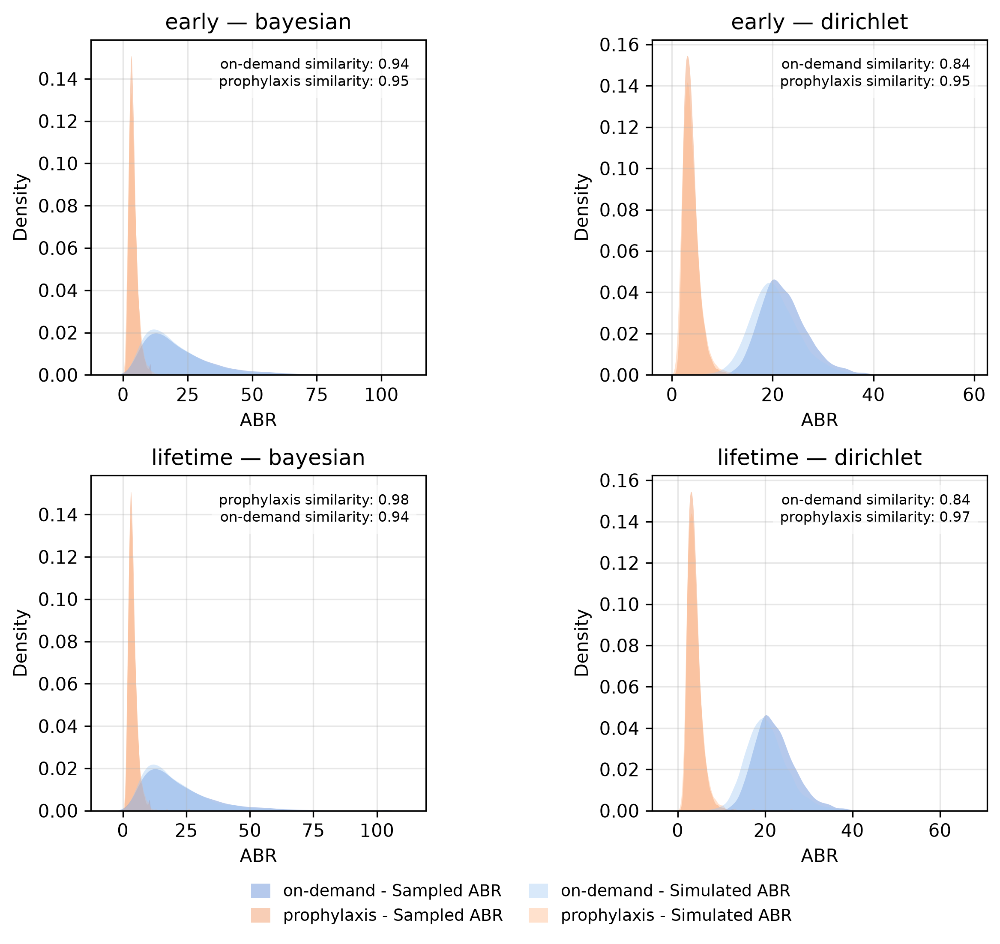

WindowsPath('C:/Users/Jino/Desktop/University/hemophilia/markov-chain-3-14/app/outputs/figures/psa_analysis/abr_distribution_by_scenario.png')

In [22]:
# plot abr distribution per base scenarios
@apply_grid(
    row_values=["early", "lifetime"],
    col_values=["bayesian", "dirichlet"],
    row_name="time_horizon",
    col_name="sampling_method",
    dataframe=df_base,
    figsize=(11, 8),
    gridspec_kw={"wspace": 0.05, "hspace": 0.30, "bottom": 0.13},
)
def plot_abr_and_bleeding(ax, sub, row_value, col_value, i, j):
    """
    Plot input ABR and outcome bleeding distributions per scenario using KDE
    """

    if sub.is_empty():
        ax.text(0.5, 0.5, "No data", ha="center", va="center", fontsize=12, alpha=0.6)
        ax.set_axis_off()
        return

    # Palettes
    abr_palette = sns.color_palette("muted", n_colors=sub["regime"].n_unique())
    bleeding_palette = sns.color_palette("pastel", n_colors=sub["regime"].n_unique())
    regimes = sub["regime"].unique().to_list()

    # Plot KDE for sampled ABR
    sns.kdeplot(
        data=sub,
        x="sampled_abr",
        hue="regime",
        ax=ax,
        fill=True,
        alpha=0.4,
        palette=abr_palette,
        linewidth=0.0,
        legend=False,
    )

    # Plot KDE for annual bleeding rate
    sns.kdeplot(
        data=sub,
        x="annual_bleeding_rate",
        hue="regime",
        ax=ax,
        fill=True,
        alpha=0.4,
        palette=bleeding_palette,
        linewidth=0.0,
        legend=False,
    )

    ax.set_xlabel("ABR")
    ax.set_ylabel("Density")
    ax.set_title(f"{row_value} - {col_value}")
    ax.grid(True, alpha=0.3)

    # Build the legend handles for the figure-level legend drawn
    # below the grid. We do NOT call ``ax.legend`` here because the
    # in-axes legend overlaps the KDE curves.
    legend_elements = []
    for color, regime in zip(abr_palette, regimes):
        legend_elements.append(
            Patch(
                facecolor=color,
                alpha=0.4,
                label=f"{regime} - Sampled ABR",
            )
        )
    for color, regime in zip(bleeding_palette, regimes):
        legend_elements.append(
            Patch(
                facecolor=color,
                alpha=0.4,
                label=f"{regime} - Simulated ABR",
            )
        )
    # Stash the handles on the Axes so the wrapper can collect them.
    ax._legend_handles = legend_elements  # type: ignore[attr-defined]

    # Compute similarity for each regime using KS statistic
    sim_texts = []
    for regime in regimes:
        abr_data = sub.filter(sub["regime"] == regime).select("sampled_abr").to_series()
        bleed_data = (
            sub.filter(sub["regime"] == regime)
            .select("annual_bleeding_rate")
            .to_series()
        )
        ks_stat, _ = ks_2samp(abr_data, bleed_data)
        similarity = 1 - ks_stat  # type: ignore
        sim_texts.append(f"{regime} similarity: {similarity:.2f}")

    # Annotate similarity on the plot (lower-left, away from the
    # KDE peak at upper-right)
    ax.text(
        0.95,
        0.95,
        "\n".join(sim_texts),
        ha="right",
        va="top",
        transform=ax.transAxes,
        fontsize=8,
        bbox=dict(facecolor="white", alpha=0.6, edgecolor="none"),
    )


fig, axes = plot_abr_and_bleeding()

# Draw a single figure-level legend below the grid, collecting the
# per-subplot handles. The first non-empty subplot's handles
# represent the union; the rest are identical because all subplots
# share the same regimes.
first_ax = axes[0][0] if hasattr(axes[0], "__len__") else axes[0]
handles = getattr(first_ax, "_legend_handles", None) or []
if handles:
    fig.legend(
        handles=handles,
        loc="lower center",
        bbox_to_anchor=(0.5, 0.005),
        ncol=2,
        frameon=False,
        fontsize=9,
        handlelength=1.2,
        handleheight=1.0,
        columnspacing=1.6,
    )
    fig.subplots_adjust(bottom=0.15)
plt.show()
save_plot(fig, "abr_distribution_by_scenario.png")

In [23]:
# calibration report

from app.notebook.calibration import build_calibration_report

calibration_report = build_calibration_report(df_base)

display_cols = [
    "time_horizon",
    "sampling_method",
    "regime",
    "expected_abr",
    "realized_abr",
    "oe_ratio",
    "relative_error",
    "distribution_similarity_index",
    "pearson_r",
    "rmse",
    "mortality_rate",
    "calibration_status",
]

print(calibration_report.select(display_cols).with_columns(pl.col(pl.Float64).round(3)))
display(
    df.group_by(["regime", "is_absorbed"]).agg(
        pl.col("sampled_abr").mean(),
        pl.col("annual_bleeding_rate").mean(),
        pl.col("person_years").mean(),
    )
)
print("NOTE: structural under-realization due to cycle/event mechanics")
note = """
Bayesian parameter sampling introduced greater between-patient heterogeneity,
which amplified nonlinear interactions with event truncation and competing mortality,
leading to reduced calibration stability in high-intensity bleeding scenarios.
Dirichlet-based sampling produced more stable calibration due to implicit shrinkage of extreme parameter values."""
print(note)

shape: (8, 12)
┌────────────┬────────────┬────────────┬───────────┬───┬───────────┬───────┬───────────┬───────────┐
│ time_horiz ┆ sampling_m ┆ regime     ┆ expected_ ┆ … ┆ pearson_r ┆ rmse  ┆ mortality ┆ calibrati │
│ on         ┆ ethod      ┆ ---        ┆ abr       ┆   ┆ ---       ┆ ---   ┆ _rate     ┆ on_status │
│ ---        ┆ ---        ┆ str        ┆ ---       ┆   ┆ f64       ┆ f64   ┆ ---       ┆ ---       │
│ str        ┆ str        ┆            ┆ f64       ┆   ┆           ┆       ┆ f64       ┆ str       │
╞════════════╪════════════╪════════════╪═══════════╪═══╪═══════════╪═══════╪═══════════╪═══════════╡
│ early      ┆ bayesian   ┆ on-demand  ┆ 22.577    ┆ … ┆ 0.956     ┆ 6.08  ┆ 0.671     ┆ Needs Inv │
│            ┆            ┆            ┆           ┆   ┆           ┆       ┆           ┆ estigatio │
│            ┆            ┆            ┆           ┆   ┆           ┆       ┆           ┆ n         │
│ early      ┆ bayesian   ┆ prophylaxi ┆ 3.871     ┆ … ┆ 0.812     ┆ 1.166 ┆

regime,is_absorbed,sampled_abr,annual_bleeding_rate,person_years
str,bool,f64,f64,f64
"""on-demand""",true,23.4494,20.936424,17.626421
"""prophylaxis""",false,3.731669,3.64984,10.10673
"""prophylaxis""",true,3.941777,4.067833,33.026654
"""on-demand""",false,19.538471,17.854427,10.180884


NOTE: structural under-realization due to cycle/event mechanics

Bayesian parameter sampling introduced greater between-patient heterogeneity,
which amplified nonlinear interactions with event truncation and competing mortality,
leading to reduced calibration stability in high-intensity bleeding scenarios.
Dirichlet-based sampling produced more stable calibration due to implicit shrinkage of extreme parameter values.


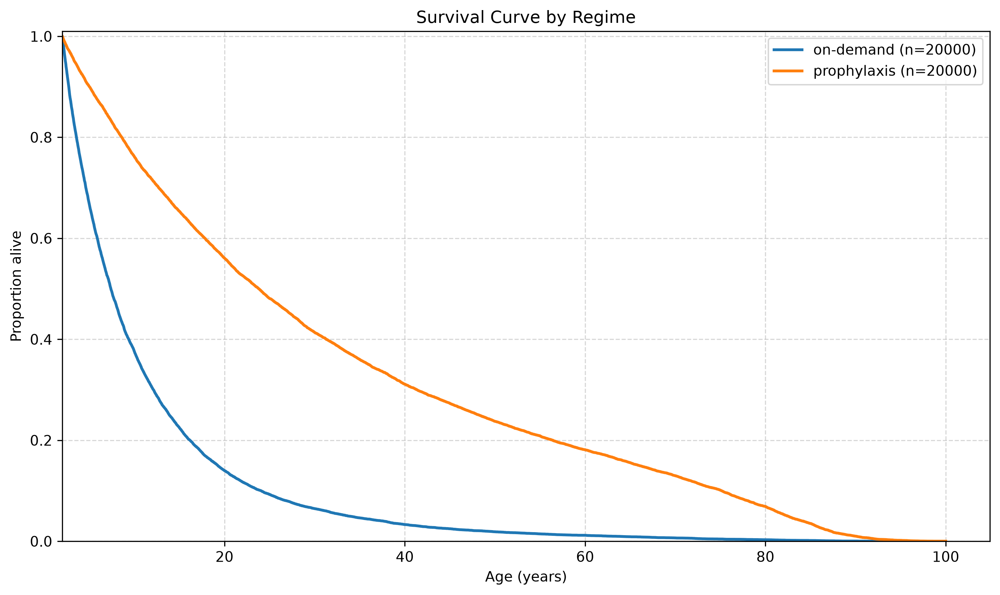

WindowsPath('C:/Users/Jino/Desktop/University/hemophilia/markov-chain-3-14/app/outputs/figures/psa_analysis/survival_curve_by_regime.png')

In [24]:
# SURVIVAL CURVE PLOT
fig, ax = plt.subplots(figsize=(10, 6))


def plot_survival_curve(
    df: pl.DataFrame, ax: plt.Axes, baseline_age: float = 2.0 # type: ignore
):  # type: ignore
    for regime in regimes:
        regime_df = df.filter(pl.col("regime") == regime)

        mask = (pl.col("time_horizon") == "lifetime") & (
            pl.col("sampling_method").is_in(["bayesian", "dirichlet"])
        )
        survival_df = regime_df.filter(mask).select(
            "observed_cycles", "cycles", "is_absorbed"
        ).drop_nulls()
        if survival_df.is_empty():
            continue

        max_weeks = int(survival_df["cycles"].max() or 0)  # type: ignore
        if max_weeks <= 0:
            continue

        observed_weeks = survival_df["observed_cycles"]
        is_absorbed = survival_df["is_absorbed"]
        survival = []
        for week in range(max_weeks + 1):
            # Patients without an absorption event are right-censored at
            # the horizon and therefore remain alive at the final point.
            alive = int(((~is_absorbed) | (observed_weeks > week)).sum() or 0)
            survival.append(alive / survival_df.height)

        ages = baseline_age + np.arange(max_weeks + 1) / 52
        ax.plot(
            ages,
            survival,
            linewidth=2,
            label=f"{regime} (n={survival_df.height})",
        )

    if not ax.lines:
        ax.text(
            0.5,
            0.5,
            "No survival data available",
            ha="center",
            va="center",
            transform=ax.transAxes,
        )
        ax.set_xlim(0, 1)
        ax.set_ylim(0, 1)
    else:
        ax.set_xlabel("Age (years)")
        ax.set_xlim(left=baseline_age)
        ax.set_ylim(0, 1.01)
        ax.set_ylabel("Proportion alive")
        ax.set_title("Survival Curve by Regime")
        ax.grid(True, linestyle="--", alpha=0.5)
        ax.legend()


plot_survival_curve(df=df_base, ax=ax)
fig.tight_layout()
plt.show()
save_plot(fig, "survival_curve_by_regime.png")

In [25]:
# ICER comparison structure (pairs)
# -------------------------------------
from app.notebook.scenario_helpers import pair_scenarios

pairs = pair_scenarios(sorted(scenarios))
for pair in pairs:
    print(pair)

('early on-demand bayesian', 'early prophylaxis bayesian')
('early on-demand bayesian is_discounting', 'early prophylaxis bayesian is_discounting')
('early on-demand bayesian ltb_absolute', 'early prophylaxis bayesian ltb_absolute')
('early on-demand bayesian weight_reduction_10', 'early prophylaxis bayesian weight_reduction_10')
('early on-demand bayesian weight_reduction_20', 'early prophylaxis bayesian weight_reduction_20')
('early on-demand bayesian weight_reduction_30', 'early prophylaxis bayesian weight_reduction_30')
('early on-demand dirichlet', 'early prophylaxis dirichlet')
('early on-demand dirichlet ltb_absolute', 'early prophylaxis dirichlet ltb_absolute')
('lifetime on-demand bayesian', 'lifetime prophylaxis bayesian')
('lifetime on-demand bayesian is_discounting', 'lifetime prophylaxis bayesian is_discounting')
('lifetime on-demand bayesian ltb_absolute', 'lifetime prophylaxis bayesian ltb_absolute')
('lifetime on-demand bayesian weight_reduction_10', 'lifetime prophylax

In [26]:
# Clinical (Bleeding Summary)
# -----------------------------
# The custom aggregators ``mean_sd`` / ``median_iqr`` are string
# formatters that have no polars expression equivalent, so we drop into
# pandas at the groupby boundary and convert back to polars.
import pandas as pd


def _group_with_callables(df: pl.DataFrame, by: str, aggs: dict) -> pl.DataFrame:
    """Run a pandas-style groupby with arbitrary callable aggregators
    and return a polars DataFrame.

    ``aggs`` is a mapping of ``{output_col: (source_col, func)}``. Each
    callable is applied to the source column per group; the result is
    a single value, so the per-group aggregation works.
    """
    pdf = df.to_pandas()
    out = pdf.groupby(by, as_index=False).agg(
        **{
            out_col: pd.NamedAgg(column=src, aggfunc=fn)
            for out_col, (src, fn) in aggs.items()
        }
    )
    return pl.from_pandas(out)


import polars as pl  # only used inside _group_with_callables

clinical_summary_df = _group_with_callables(
    df,
    by="scenario",
    aggs={
        "simulations": ("scenario", "size"),
        "qaly_mean": ("total_qaly", "mean"),
        "qaly_mean_sd": ("total_qaly", mean_sd),
        "qaly_median_iqr": ("total_qaly", median_iqr),
        "pettersson_mean_sd": ("pettersson_score", mean_sd),
        "pettersson_median_iqr": ("pettersson_score", median_iqr),
    },
)

discount_pairs = {
    "early on-demand bayesian": "early on-demand bayesian is_discounting",
    "early prophylaxis bayesian": "early prophylaxis bayesian is_discounting",
    "lifetime on-demand bayesian": "lifetime on-demand bayesian is_discounting",
    "lifetime prophylaxis bayesian": "lifetime prophylaxis bayesian is_discounting",
}

print("Relative retained:")
for base, comp in discount_pairs.items():
    base_df = clinical_summary_df.filter(pl.col("scenario") == base)
    comp_df = clinical_summary_df.filter(pl.col("scenario") == comp)

    undiscounted = base_df.select("qaly_mean").item()
    discounted = comp_df.select("qaly_mean").item()

    retained = discounted / undiscounted

    print(f"{base} | {comp}: = {retained:.2%}")

print("\nNOTE: Prophylaxis major benefits are long-term preservation effects.")

show(clinical_summary_df, "Clinical outcomes")

bleeding_summary_df = _group_with_callables(
    df,
    by="scenario",
    aggs={
        "abr_mean_sd": ("annual_bleeding_rate", mean_sd),
        "abr_median_iqr": ("annual_bleeding_rate", median_iqr),
        "sbr_mean_sd": ("spontaneous_bleeding_rate", mean_sd),
        "sbr_median_iqr": ("spontaneous_bleeding_rate", median_iqr),
        "ajbr_mean_sd": ("annual_joint_bleeding_rate", mean_sd),
        "ajbr_median_iqr": ("annual_joint_bleeding_rate", median_iqr),
        "altb_mean_sd": ("annual_life_threatening_rate", mean_sd),
        "altb_median_iqr": ("annual_life_threatening_rate", median_iqr),
        "total_bleeding_events": ("bleeding_events", "sum"),
        "total_joint_bleeding_events": ("joint_bleeding_events", "sum"),
        "total_person_years": ("person_years", "sum"),
    },
).with_columns(
    (pl.col("total_bleeding_events") / pl.col("total_person_years"))
    .round(3)
    .alias("cohort_abr"),
    (pl.col("total_joint_bleeding_events") / pl.col("total_person_years"))
    .round(3)
    .alias("cohort_ajbr"),
)

show(
    bleeding_summary_df,
    "Bleeding outcome",
    {"cohort_abr": "{:.2f}", "cohort_ajbr": "{:.2f}"},
    store=True,
    options={
        "override": False,
        "storage": {
            "excel_writer": root
            / "app"
            / "outputs"
            / "sheets"
            / "bleeding_summary.xlsx",
            "index": False,
        },
    },
)

Relative retained:
early on-demand bayesian | early on-demand bayesian is_discounting: = 83.03%
early prophylaxis bayesian | early prophylaxis bayesian is_discounting: = 79.98%
lifetime on-demand bayesian | lifetime on-demand bayesian is_discounting: = 61.24%
lifetime prophylaxis bayesian | lifetime prophylaxis bayesian is_discounting: = 42.29%

NOTE: Prophylaxis major benefits are long-term preservation effects.


,scenario,simulations,qaly_mean,qaly_mean_sd,qaly_median_iqr,pettersson_mean_sd,pettersson_median_iqr
0,early on-demand bayesian,10000,4.548845,4.55 ± 3.01,"4.36 [1.62, 7.63]",5.62 ± 5.20,"4.00 [2.00, 8.00]"
1,early on-demand bayesian is_discounting,10000,3.776776,3.78 ± 2.33,"3.87 [1.54, 6.08]",5.62 ± 5.17,"4.00 [2.00, 8.00]"
2,early on-demand bayesian ltb_absolute,10000,7.600097,7.60 ± 0.97,"7.70 [7.17, 8.18]",11.68 ± 8.00,"10.00 [6.00, 15.00]"
3,early on-demand bayesian weight_reduction_10,10000,4.542116,4.54 ± 3.02,"4.37 [1.60, 7.63]",5.62 ± 5.20,"4.00 [2.00, 8.00]"
4,early on-demand bayesian weight_reduction_20,10000,4.560002,4.56 ± 3.01,"4.41 [1.62, 7.63]",5.65 ± 5.24,"4.00 [2.00, 8.00]"
5,early on-demand bayesian weight_reduction_30,10000,4.533150,4.53 ± 3.02,"4.36 [1.59, 7.64]",5.61 ± 5.21,"4.00 [2.00, 8.00]"
6,early on-demand dirichlet,10000,4.202113,4.20 ± 2.75,"3.96 [1.59, 7.24]",6.36 ± 4.79,"6.00 [2.00, 10.00]"
7,early on-demand dirichlet ltb_absolute,10000,7.466177,7.47 ± 0.69,"7.54 [7.31, 7.76]",11.88 ± 2.93,"12.00 [10.00, 14.00]"
8,early prophylaxis bayesian,10000,7.552699,7.55 ± 2.58,"8.74 [7.48, 9.13]",1.41 ± 1.10,"1.00 [1.00, 2.00]"
9,early prophylaxis bayesian is_discounting,10000,6.040789,6.04 ± 1.95,"6.91 [5.99, 7.22]",1.40 ± 1.10,"1.00 [1.00, 2.00]"


,scenario,abr_mean_sd,abr_median_iqr,sbr_mean_sd,sbr_median_iqr,ajbr_mean_sd,ajbr_median_iqr,altb_mean_sd,altb_median_iqr,total_bleeding_events,total_joint_bleeding_events,total_person_years,cohort_abr,cohort_ajbr
0,early on-demand bayesian,20.00 ± 12.77,"16.89 [10.95, 25.90]",4.07 ± 3.17,"3.32 [2.00, 5.30]",15.00 ± 10.19,"12.53 [7.90, 19.50]",0.92 ± 2.14,"0.40 [0.20, 0.83]",998567,767377,57873.269231,17.25,13.26
1,early on-demand bayesian is_discounting,19.97 ± 12.75,"16.89 [10.90, 25.84]",4.05 ± 3.16,"3.30 [2.00, 5.24]",14.98 ± 10.21,"12.55 [7.90, 19.40]",0.95 ± 2.28,"0.40 [0.20, 0.83]",997632,767512,58043.115385,17.19,13.22
2,early on-demand bayesian ltb_absolute,20.23 ± 12.95,"17.00 [11.10, 25.90]",4.75 ± 3.14,"4.00 [2.60, 6.10]",15.46 ± 10.04,"12.90 [8.40, 19.90]",0.01 ± 0.38,"0.00 [0.00, 0.00]",2002404,1531325,98881.865385,20.25,15.49
3,early on-demand bayesian weight_reduction_10,19.98 ± 12.76,"16.83 [10.98, 26.00]",4.06 ± 3.19,"3.30 [1.95, 5.30]",14.98 ± 10.20,"12.53 [7.86, 19.56]",0.95 ± 2.28,"0.40 [0.20, 0.81]",996722,767210,57785.576923,17.25,13.28
4,early on-demand bayesian weight_reduction_20,19.99 ± 12.72,"16.90 [11.00, 25.90]",4.05 ± 3.12,"3.30 [2.00, 5.30]",15.01 ± 10.18,"12.60 [7.90, 19.50]",0.94 ± 2.27,"0.40 [0.20, 0.82]",1002990,771699,58053.846154,17.28,13.29
5,early on-demand bayesian weight_reduction_30,20.00 ± 12.76,"16.90 [10.95, 26.00]",4.06 ± 3.20,"3.30 [1.96, 5.23]",14.99 ± 10.20,"12.53 [7.90, 19.50]",0.94 ± 2.19,"0.40 [0.20, 0.83]",995638,765855,57685.653846,17.26,13.28
6,early on-demand dirichlet,20.44 ± 5.02,"20.00 [17.16, 23.30]",4.16 ± 2.04,"4.03 [3.00, 5.20]",15.33 ± 4.63,"15.20 [12.63, 17.90]",0.95 ± 2.17,"0.45 [0.25, 0.83]",1115813,860340,55371.173077,20.15,15.54
7,early on-demand dirichlet ltb_absolute,20.54 ± 4.29,"20.10 [17.60, 23.10]",4.82 ± 1.36,"4.70 [3.90, 5.60]",15.71 ± 3.49,"15.40 [13.20, 17.80]",0.01 ± 0.38,"0.00 [0.00, 0.00]",2033200,1555496,98975.365385,20.54,15.72
8,early prophylaxis bayesian,3.92 ± 1.99,"3.55 [2.60, 4.78]",0.82 ± 0.58,"0.70 [0.46, 1.10]",2.85 ± 1.46,"2.60 [1.90, 3.51]",0.24 ± 0.96,"0.10 [0.00, 0.20]",315328,238244,84954.980769,3.71,2.80
9,early prophylaxis bayesian is_discounting,3.91 ± 1.98,"3.53 [2.60, 4.76]",0.82 ± 0.57,"0.70 [0.49, 1.10]",2.84 ± 1.45,"2.60 [1.90, 3.50]",0.24 ± 0.95,"0.10 [0.00, 0.20]",314363,237478,84791.576923,3.71,2.80


[20:17:59] WARNING  File C:\Users\Jino\Desktop\University\hemophilia\markov-chain-3-14\app\outputs\sheets\bleeding_summary.xlsx already exists. DataFrame not stored to avoid overwriting.


In [27]:
# Mortality & Life expectancy
# -----------------------------
mortality_summary_df = _group_with_callables(
    df,
    by="scenario",
    aggs={
        "person_years_mean_sd": ("person_years", mean_sd),
        "person_years_median_iqr": ("person_years", median_iqr),
        "lost_person_years_mean_sd": ("lost_person_years", mean_sd),
        "lost_person_years_median_iqr": ("lost_person_years", median_iqr),
        "lost_life_expectancy_median_iqr": (
            "lost_person_year_life_expectancy",
            median_iqr,
        ),
        "absorbed_percent": ("is_absorbed", percent),
    },
)

show(
    mortality_summary_df,
    "Mortality and life expectancy",
    store=True,
    options={
        "override": False,
        "storage": {
            "excel_writer": root
            / "app"
            / "outputs"
            / "sheets"
            / "mortality_summary.xlsx",
            "index": False,
        },
    },
)

,scenario,person_years_mean_sd,person_years_median_iqr,lost_person_years_mean_sd,lost_person_years_median_iqr,lost_life_expectancy_median_iqr,absorbed_percent
0,early on-demand bayesian,5.79 ± 3.71,"5.71 [2.15, 10.00]",4.21 ± 3.71,"4.29 [0.00, 7.85]","66.29 [0.00, 69.85]",67.070000
1,early on-demand bayesian is_discounting,5.80 ± 3.72,"5.79 [2.13, 10.00]",4.20 ± 3.72,"4.21 [0.00, 7.87]","66.21 [0.00, 69.87]",66.950000
2,early on-demand bayesian ltb_absolute,9.89 ± 0.85,"10.00 [10.00, 10.00]",0.11 ± 0.85,"0.00 [0.00, 0.00]","0.00 [0.00, 0.00]",2.300000
3,early on-demand bayesian weight_reduction_10,5.78 ± 3.72,"5.73 [2.12, 10.00]",4.22 ± 3.72,"4.27 [0.00, 7.88]","66.27 [0.00, 69.88]",66.960000
4,early on-demand bayesian weight_reduction_20,5.81 ± 3.72,"5.75 [2.13, 10.00]",4.19 ± 3.72,"4.25 [0.00, 7.87]","66.25 [0.00, 69.87]",66.810000
5,early on-demand bayesian weight_reduction_30,5.77 ± 3.72,"5.73 [2.10, 10.00]",4.23 ± 3.72,"4.27 [0.00, 7.90]","66.27 [0.00, 69.90]",67.410000
6,early on-demand dirichlet,5.54 ± 3.64,"5.17 [2.06, 10.00]",4.46 ± 3.64,"4.83 [0.00, 7.94]","66.83 [0.00, 69.94]",72.010000
7,early on-demand dirichlet ltb_absolute,9.90 ± 0.82,"10.00 [10.00, 10.00]",0.10 ± 0.82,"0.00 [0.00, 0.00]","0.00 [0.00, 0.00]",2.090000
8,early prophylaxis bayesian,8.50 ± 2.85,"10.00 [8.63, 10.00]",1.50 ± 2.85,"0.00 [0.00, 1.37]","0.00 [0.00, 63.37]",28.230000
9,early prophylaxis bayesian is_discounting,8.48 ± 2.87,"10.00 [8.65, 10.00]",1.52 ± 2.87,"0.00 [0.00, 1.35]","0.00 [0.00, 63.35]",28.210000


[20:18:00] WARNING  File C:\Users\Jino\Desktop\University\hemophilia\markov-chain-3-14\app\outputs\sheets\mortality_summary.xlsx already exists. DataFrame not stored to avoid overwriting.


In [28]:
# Resource Utilization
# -----------------------------
factor_summary_df = _group_with_callables(
    df,
    by="scenario",
    aggs={
        "total_factor_mean_sd": ("total_factor", mean_sd),
        "total_factor_median_iqr": ("total_factor", median_iqr),
        "min_total_factor": ("total_factor", "min"),
        "max_total_factor": ("total_factor", "max"),
        "total_cost_mean": ("total_cost", "mean"),
    },
)

print("Relative retained:")
for base, comp in discount_pairs.items():
    base_df = factor_summary_df.filter(pl.col("scenario") == base)
    comp_df = factor_summary_df.filter(pl.col("scenario") == comp)

    undiscounted = base_df.select("total_cost_mean").item()
    discounted = comp_df.select("total_cost_mean").item()

    retained = discounted / undiscounted

    print(f"{base} | {comp}: = {retained:.2%}")

print("\nNOTE: Most economic burden in hemophilia is long-term, not immediate.")

show(
    factor_summary_df,
    "Resource Utilization",
    {"total_cost_mean": "{:,.0f} IRR"},
    store=True,
    options={
        "override": False,
        "storage": {
            "excel_writer": root / "app" / "outputs" / "sheets" / "factor_summary.xlsx",
            "index": False,
        },
    },
)

Relative retained:
early on-demand bayesian | early on-demand bayesian is_discounting: = 76.87%
early prophylaxis bayesian | early prophylaxis bayesian is_discounting: = 73.11%
lifetime on-demand bayesian | lifetime on-demand bayesian is_discounting: = 45.97%
lifetime prophylaxis bayesian | lifetime prophylaxis bayesian is_discounting: = 25.32%

NOTE: Most economic burden in hemophilia is long-term, not immediate.


,scenario,total_factor_mean_sd,total_factor_median_iqr,min_total_factor,max_total_factor,total_cost_mean
0,early on-demand bayesian,171084.71 ± 159397.55,"128405.50 [49425.00, 243776.25]",0,1350027,"9,900,142,525 IRR"
1,early on-demand bayesian is_discounting,171030.11 ± 157716.27,"128662.00 [49281.50, 246145.00]",0,1462740,"7,610,427,128 IRR"
2,early on-demand bayesian ltb_absolute,359556.45 ± 237726.34,"303678.50 [193957.50, 460069.50]",0,1789105,"20,774,839,445 IRR"
3,early on-demand bayesian weight_reduction_10,153325.77 ± 142602.91,"114007.00 [43784.25, 219456.00]",0,1198481,"8,874,412,865 IRR"
4,early on-demand bayesian weight_reduction_20,137780.46 ± 128380.85,"103384.00 [39955.75, 197511.25]",0,1204125,"7,975,464,034 IRR"
5,early on-demand bayesian weight_reduction_30,119227.82 ± 110762.22,"89257.50 [33953.75, 169970.75]",0,1152395,"6,897,861,907 IRR"
6,early on-demand dirichlet,192479.89 ± 155902.88,"150098.50 [49331.25, 322010.25]",465,742424,"11,136,650,319 IRR"
7,early on-demand dirichlet ltb_absolute,364854.93 ± 93240.30,"357132.00 [304425.00, 419654.50]",956,889121,"21,114,694,932 IRR"
8,early prophylaxis bayesian,837021.01 ± 347601.33,"941487.00 [740548.25, 1067261.25]",3959,1671531,"48,468,112,670 IRR"
9,early prophylaxis bayesian is_discounting,836684.14 ± 350078.23,"944402.00 [732050.75, 1069111.75]",4642,1613448,"35,433,332,244 IRR"


[20:18:00] WARNING  File C:\Users\Jino\Desktop\University\hemophilia\markov-chain-3-14\app\outputs\sheets\factor_summary.xlsx already exists. DataFrame not stored to avoid overwriting.


In [29]:
# Health State Occupation
# -----------------------------
weekly_state_df = (
    df.group_by("scenario")
    .agg(
        healthy=pl.col("healthy_share").mean(),
        bleeding=pl.col("bleeding_share").mean(),
        hemarthrosis=pl.col("hemarthrosis_share").mean(),
        lt_bleeding=pl.col("lt_bleeding_share").mean(),
        death=pl.col("death_share").mean(),
    )
    .with_columns(
        pl.col("healthy").round(3),
        pl.col("bleeding").round(3),
        pl.col("hemarthrosis").round(3),
        pl.col("lt_bleeding").round(3),
        pl.col("death").round(3),
    )
)

show(
    weekly_state_df,
    "Health State Occupation",
    store=True,
    options={
        "override": False,
        "storage": {
            "excel_writer": root / "app" / "outputs" / "sheets" / "weekly_state.xlsx",
            "index": False,
        },
    },
)

,scenario,healthy,bleeding,hemarthrosis,lt_bleeding,death
0,lifetime on-demand bayesian weight_reduction_30,0.675000,0.073000,0.234000,0.018000,0.000000
1,lifetime on-demand dirichlet,0.654000,0.076000,0.251000,0.019000,0.000000
2,lifetime prophylaxis bayesian weight_reduction_20,0.925000,0.016000,0.053000,0.006000,0.000000
3,lifetime on-demand bayesian weight_reduction_20,0.675000,0.073000,0.234000,0.018000,0.000000
4,lifetime prophylaxis dirichlet,0.926000,0.016000,0.052000,0.006000,0.000000
5,early on-demand bayesian ltb_absolute,0.675000,0.085000,0.240000,0.000000,0.000000
6,early prophylaxis bayesian weight_reduction_10,0.927000,0.016000,0.053000,0.005000,0.000000
7,lifetime on-demand bayesian weight_reduction_10,0.675000,0.073000,0.234000,0.018000,0.000000
8,early on-demand bayesian weight_reduction_10,0.676000,0.073000,0.233000,0.018000,0.000000
9,early prophylaxis dirichlet,0.927000,0.015000,0.052000,0.005000,0.000000


[20:18:00] WARNING  File C:\Users\Jino\Desktop\University\hemophilia\markov-chain-3-14\app\outputs\sheets\weekly_state.xlsx already exists. DataFrame not stored to avoid overwriting.


In [30]:
# Cohort-level survival proxy metrics
# -------------------------------------
survival_df = (
    df.group_by("scenario")
    .agg(
        simulations=pl.len(),
        absorbed_rate=pl.col("is_absorbed").mean(),
        person_years=pl.col("person_years").sum(),
        lost_person_years=pl.col("lost_person_years").sum(),
    )
    .with_columns(
        survival_efficiency=(
            pl.col("person_years")
            / (pl.col("person_years") + pl.col("lost_person_years"))
        )
    )
)

# Pairwise survival comparison
rows = []

for base, comp in pairs:
    base_row = survival_df.filter(pl.col("scenario") == base).row(0, named=True)
    comp_row = survival_df.filter(pl.col("scenario") == comp).row(0, named=True)

    base_eff = base_row["survival_efficiency"]
    comp_eff = comp_row["survival_efficiency"]

    delta_eff = comp_eff - base_eff
    rr = comp_eff / base_eff if base_eff != 0 else np.nan

    rows.append(
        {
            "comparison": f"{comp} vs {base}",
            "base_survival_efficiency": base_eff,
            "comp_survival_efficiency": comp_eff,
            "absolute_survival_gain": delta_eff,
            "relative_survival_ratio": rr,
            "relative_survival_gain_%": float((rr - 1) * 100),
            "absorbed_rate_base": base_row["absorbed_rate"],
            "absorbed_rate_comp": comp_row["absorbed_rate"],
        }
    )

mortality_proxy_df = pl.DataFrame(rows)

show(
    mortality_proxy_df,
    "Pairwise Survival Efficiency Comparison",
    {
        "base_survival_efficiency": "{:.3f}",
        "comp_survival_efficiency": "{:.3f}",
        "absolute_survival_gain": "{:+.3f}",
        "relative_survival_ratio": "{:.3f}",
        "relative_survival_gain_%": "{:+.1f}",
        "absorbed_rate_base": "{:.2%}",
        "absorbed_rate_comp": "{:.2%}",
    },
    store=True,
    options={
        "override": False,
        "storage": {
            "excel_writer": root
            / "app"
            / "outputs"
            / "sheets"
            / "mortality_proxy.xlsx",
            "index": False,
        },
    },
)

,comparison,base_survival_efficiency,comp_survival_efficiency,absolute_survival_gain,relative_survival_ratio,relative_survival_gain_%,absorbed_rate_base,absorbed_rate_comp
0,early prophylaxis bayesian vs early on-demand bayesian,0.579,0.850,+0.271,1.468,+46.8,67.07%,28.23%
1,early prophylaxis bayesian is_discounting vs early on-demand bayesian is_discounting,0.580,0.848,+0.267,1.461,+46.1,66.95%,28.21%
2,early prophylaxis bayesian ltb_absolute vs early on-demand bayesian ltb_absolute,0.989,0.984,-0.004,0.995,-0.5,2.30%,2.96%
3,early prophylaxis bayesian weight_reduction_10 vs early on-demand bayesian weight_reduction_10,0.578,0.851,+0.273,1.473,+47.3,66.96%,27.79%
4,early prophylaxis bayesian weight_reduction_20 vs early on-demand bayesian weight_reduction_20,0.581,0.850,+0.270,1.464,+46.4,66.81%,27.98%
5,early prophylaxis bayesian weight_reduction_30 vs early on-demand bayesian weight_reduction_30,0.577,0.848,+0.271,1.471,+47.1,67.41%,28.13%
6,early prophylaxis dirichlet vs early on-demand dirichlet,0.554,0.850,+0.296,1.535,+53.5,72.01%,27.78%
7,early prophylaxis dirichlet ltb_absolute vs early on-demand dirichlet ltb_absolute,0.990,0.984,-0.006,0.994,-0.6,2.09%,3.05%
8,lifetime prophylaxis bayesian vs lifetime on-demand bayesian,0.106,0.303,+0.198,2.870,+187.0,100.00%,99.99%
9,lifetime prophylaxis bayesian is_discounting vs lifetime on-demand bayesian is_discounting,0.104,0.304,+0.199,2.915,+191.5,100.00%,99.98%


[20:18:00] WARNING  File C:\Users\Jino\Desktop\University\hemophilia\markov-chain-3-14\app\outputs\sheets\mortality_proxy.xlsx already exists. DataFrame not stored to avoid overwriting.


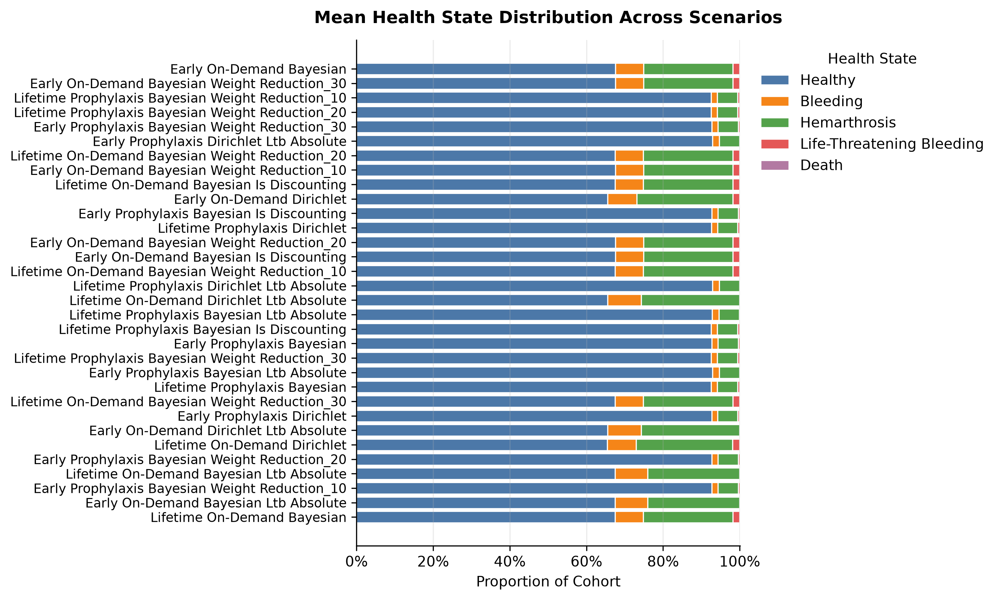

In [31]:
# Mean Health State Distribution Across Scenarios
from matplotlib.ticker import PercentFormatter

label_map = {
    "healthy": "Healthy",
    "bleeding": "Bleeding",
    "hemarthrosis": "Hemarthrosis",
    "lt_bleeding": "Life-Threatening Bleeding",
    "death": "Death",
}

# Polars equivalent of pandas ``melt`` is ``unpivot``.
long_df = weekly_state_df.unpivot(
    index="scenario",
    on=states,
    variable_name="health_state",
    value_name="proportion",
).with_columns(
    pl.col("health_state").replace_strict(label_map).alias("health_state"),
    pl.col("scenario").str.replace("_", " ").str.to_titlecase().alias("scenario"),
)

# Manual pivot: average proportion per (scenario, health_state).
pivoted = (
    long_df.group_by(["scenario", "health_state"])
    .agg(pl.col("proportion").mean().alias("proportion"))
    .pivot(on="health_state", index="scenario", values="proportion")
    .fill_null(0.0)
)

state_order = [
    "Healthy",
    "Bleeding",
    "Hemarthrosis",
    "Life-Threatening Bleeding",
    "Death",
]

# Reorder columns. Polars ``select`` keeps only the listed columns in
# the order given.
pivoted = pivoted.select(["scenario", *state_order]).with_columns(
    pl.all().exclude("scenario").clip(lower_bound=0.0)
)

colors = {
    "Healthy": "#4C78A8",
    "Bleeding": "#F58518",
    "Hemarthrosis": "#54A24B",
    "Life-Threatening Bleeding": "#E45756",
    "Death": "#B279A2",
}

fig, ax = plt.subplots(figsize=(10, 6))

y = np.arange(pivoted.height)
left = np.zeros(pivoted.height)

for state in state_order:
    values = pivoted[state].to_numpy()

    ax.barh(
        y,
        values,
        left=left,
        label=state,
        color=colors[state],
        edgecolor="white",
        linewidth=0.8,
    )

    left += values

ax.set_yticks(y)
ax.set_yticklabels(pivoted["scenario"].to_list(), fontsize=9)

ax.set_xlabel("Proportion of Cohort")
ax.set_title("Mean Health State Distribution Across Scenarios", pad=12, weight="bold")

ax.xaxis.set_major_formatter(PercentFormatter(1.0))

ax.grid(axis="x", alpha=0.25)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

ax.legend(
    title="Health State",
    bbox_to_anchor=(1.02, 1),
    loc="upper left",
    frameon=False,
)

plt.tight_layout()
plt.show()

In [32]:
# ABR REDUCTION TABLE
# =====================================================

abr_results = []

for base, comp in pairs:
    base_row = (
        bleeding_summary_df.filter(pl.col("scenario") == base)
        .select("cohort_abr")
        .item()
    )

    comp_row = (
        bleeding_summary_df.filter(pl.col("scenario") == comp)
        .select("cohort_abr")
        .item()
    )

    absolute_reduction = base_row - comp_row
    relative_reduction = absolute_reduction / base_row

    abr_results.append(
        {
            "base_scenario": base,
            "comparison_scenario": comp,
            "base_cohort_abr": round(base_row, 3),
            "comparison_cohort_abr": round(comp_row, 3),
            "absolute_abr_reduction": round(absolute_reduction, 3),
            "relative_abr_reduction": f"{relative_reduction:.2%}",
        }
    )

abr_reduction_df = pl.DataFrame(abr_results)

show(
    abr_reduction_df,
    "Relative and Absolute ABR Reduction",
    {
        "base_cohort_abr": "{:.3f}",
        "comparison_cohort_abr": "{:.3f}",
        "absolute_abr_reduction": "{:.3f}",
    },
)

# =====================================================
# FACTOR CONSUMPTION REDUCTION TABLE
# =====================================================

factor_results = []

for base, comp in pairs:
    base_factor = df.filter(pl.col("scenario") == base)["total_factor"].mean()
    comp_factor = df.filter(pl.col("scenario") == comp)["total_factor"].mean()

    absolute_reduction = base_factor - comp_factor  # type: ignore

    relative_reduction = absolute_reduction / base_factor  # type: ignore

    factor_results.append(
        {
            "base_scenario": base,
            "comparison_scenario": comp,
            "base_factor_mean": round(base_factor, 0),  # type: ignore
            "comparison_factor_mean": round(comp_factor, 0),  # type: ignore
            "absolute_factor_reduction": round(absolute_reduction, 0),  # type: ignore
            "relative_factor_reduction": f"{relative_reduction:.2%}",
        }
    )

factor_reduction_df = pl.DataFrame(factor_results)

show(
    factor_reduction_df,
    "Relative and Absolute Factor Consumption Reduction",
    {
        "absolute_factor_reduction": "{:,.0f} U",
        "comparison_factor_mean": "{:,.0f} U",
        "base_factor_mean": "{:,.0f} U",
    },
)

,base_scenario,comparison_scenario,base_cohort_abr,comparison_cohort_abr,absolute_abr_reduction,relative_abr_reduction
0,early on-demand bayesian,early prophylaxis bayesian,17.254,3.712,13.542,78.49%
1,early on-demand bayesian is_discounting,early prophylaxis bayesian is_discounting,17.188,3.707,13.481,78.43%
2,early on-demand bayesian ltb_absolute,early prophylaxis bayesian ltb_absolute,20.250,3.811,16.439,81.18%
3,early on-demand bayesian weight_reduction_10,early prophylaxis bayesian weight_reduction_10,17.249,3.713,13.536,78.47%
4,early on-demand bayesian weight_reduction_20,early prophylaxis bayesian weight_reduction_20,17.277,3.711,13.566,78.52%
5,early on-demand bayesian weight_reduction_30,early prophylaxis bayesian weight_reduction_30,17.260,3.705,13.555,78.53%
6,early on-demand dirichlet,early prophylaxis dirichlet,20.152,3.666,16.486,81.81%
7,early on-demand dirichlet ltb_absolute,early prophylaxis dirichlet ltb_absolute,20.542,3.762,16.780,81.69%
8,lifetime on-demand bayesian,lifetime prophylaxis bayesian,14.833,3.444,11.389,76.78%
9,lifetime on-demand bayesian is_discounting,lifetime prophylaxis bayesian is_discounting,14.882,3.434,11.448,76.93%


,base_scenario,comparison_scenario,base_factor_mean,comparison_factor_mean,absolute_factor_reduction,relative_factor_reduction
0,early on-demand bayesian,early prophylaxis bayesian,"171,085 U","837,021 U","-665,936 U",-389.24%
1,early on-demand bayesian is_discounting,early prophylaxis bayesian is_discounting,"171,030 U","836,684 U","-665,654 U",-389.20%
2,early on-demand bayesian ltb_absolute,early prophylaxis bayesian ltb_absolute,"359,556 U","991,491 U","-631,935 U",-175.75%
3,early on-demand bayesian weight_reduction_10,early prophylaxis bayesian weight_reduction_10,"153,326 U","757,668 U","-604,342 U",-394.16%
4,early on-demand bayesian weight_reduction_20,early prophylaxis bayesian weight_reduction_20,"137,780 U","672,630 U","-534,849 U",-388.19%
5,early on-demand bayesian weight_reduction_30,early prophylaxis bayesian weight_reduction_30,"119,228 U","585,485 U","-466,257 U",-391.06%
6,early on-demand dirichlet,early prophylaxis dirichlet,"192,480 U","839,863 U","-647,383 U",-336.34%
7,early on-demand dirichlet ltb_absolute,early prophylaxis dirichlet ltb_absolute,"364,855 U","992,752 U","-627,897 U",-172.09%
8,lifetime on-demand bayesian,lifetime prophylaxis bayesian,"483,001 U","7,927,419 U","-7,444,418 U",-1541.29%
9,lifetime on-demand bayesian is_discounting,lifetime prophylaxis bayesian is_discounting,"472,564 U","7,936,626 U","-7,464,063 U",-1579.48%


In [33]:
# ICER & NMB Results

gdp_per_capita = context.economic_policy.gdp_per_capita.IRR
disease_wtp_ratio = context.economic_policy.wtp_multiplier.rare
WTP = gdp_per_capita * disease_wtp_ratio

summary = df.group_by("scenario").agg(
    mean_cost=pl.col("total_cost").mean(),
    mean_qaly=pl.col("total_qaly").mean(),
    sd_cost=pl.col("total_cost").std(),
    sd_qaly=pl.col("total_qaly").std(),
    n=pl.col("total_cost").count(),
)

rows = []

for base, comp in pairs:

    base_df = df.filter(pl.col("scenario") == base)
    comp_df = df.filter(pl.col("scenario") == comp)

    base_row = summary.filter(pl.col("scenario") == base).row(0, named=True)
    comp_row = summary.filter(pl.col("scenario") == comp).row(0, named=True)

    delta_cost = comp_row["mean_cost"] - base_row["mean_cost"]
    delta_qaly = comp_row["mean_qaly"] - base_row["mean_qaly"]

    if delta_cost < 0 and delta_qaly > 0:
        icer = np.nan
        interpretation = "Dominant"
    elif delta_cost > 0 and delta_qaly < 0:
        icer = np.nan
        interpretation = "Dominated"
    elif np.isclose(delta_qaly, 0):
        icer = np.nan
        interpretation = "Undefined"
    elif delta_cost < 0 and delta_qaly < 0:
        interpretation = "Trade-off (less effective, cheaper)"
    else:
        icer = delta_cost / delta_qaly
        interpretation = "Cost-effective" if icer < WTP else "Not cost-effective"

    nmb_base = base_df["total_qaly"] * WTP - base_df["total_cost"]
    nmb_comp = comp_df["total_qaly"] * WTP - comp_df["total_cost"]

    delta_nmb = nmb_comp.mean() - nmb_base.mean()  # type: ignore

    prob_ce = (nmb_comp.to_numpy() > nmb_base.to_numpy()).mean()

    cost_ci = np.percentile(
        comp_df["total_cost"].to_numpy() - base_df["total_cost"].mean(),
        [2.5, 97.5],
    )

    qaly_ci = np.percentile(
        comp_df["total_qaly"].to_numpy() - base_df["total_qaly"].mean(),
        [2.5, 97.5],
    )

    rows.append(
        {
            "comparison": f"{comp} vs {base}",
            "Δ cost": delta_cost,
            "Δ cost 95% CI": f"[{cost_ci[0]:,.0f}, {cost_ci[1]:,.0f}]",
            "Δ QALY": delta_qaly,
            "Δ QALY 95% CI": f"[{qaly_ci[0]:.3f}, {qaly_ci[1]:.3f}]",
            "ICER": icer,  # type: ignore
            "Interpretation": interpretation,
            "Δ NMB": delta_nmb,
            "Probability CE": prob_ce,
            "Cost-effective (NMB)": delta_nmb > 0,  # type: ignore
        }
    )

icer_nmb_df = pl.DataFrame(rows)

show(
    icer_nmb_df,
    f"ICER & NMB Results (WTP = {WTP:,.0f} IRR/QALY)",
    {
        "Δ cost": "{:,.0f}",
        "Δ QALY": "{:.3f}",
        "ICER": "{:,.0f}",
        "Δ NMB": "{:,.0f}",
        "Probability CE": "{:.1%}",
    },
)

,comparison,Δ cost,Δ cost 95% CI,Δ QALY,Δ QALY 95% CI,ICER,Interpretation,Δ NMB,Probability CE,Cost-effective (NMB)
0,early prophylaxis bayesian vs early on-demand bayesian,"38,567,970,146","[-7,334,364,245, 66,430,045,461]",3.004,"[-3.881, 4.992]","12,839,496,230",Cost-effective,"15,501,399,102",58.0%,True
1,early prophylaxis bayesian is_discounting vs early on-demand bayesian is_discounting,"27,822,905,116","[-5,254,149,554, 47,216,799,194]",2.264,"[-3.123, 3.777]","12,289,201,949",Cost-effective,"12,929,317,376",58.2%,True
2,early prophylaxis bayesian ltb_absolute vs early on-demand bayesian ltb_absolute,"36,589,962,145","[16,041,947,991, 56,016,089,921]",1.142,"[-0.629, 1.970]","32,041,269,610",Not cost-effective,"-16,034,618,158",26.1%,False
3,early prophylaxis bayesian weight_reduction_10 vs early on-demand bayesian weight_reduction_10,"34,924,816,992","[-6,613,130,801, 59,870,981,552]",3.019,"[-3.868, 4.989]","11,567,780,165",Cost-effective,"19,419,810,663",59.7%,True
4,early prophylaxis bayesian weight_reduction_20 vs early on-demand bayesian weight_reduction_20,"30,929,938,744","[-5,950,563,713, 53,464,798,341]",2.990,"[-3.877, 4.975]","10,344,673,727",Cost-effective,"22,888,955,122",61.0%,True
5,early prophylaxis bayesian weight_reduction_30 vs early on-demand bayesian weight_reduction_30,"26,956,582,109","[-5,243,929,975, 46,267,351,245]",3.003,"[-3.901, 5.016]","8,975,972,215",Cost-effective,"27,100,902,291",63.4%,True
6,early prophylaxis dirichlet vs early on-demand dirichlet,"37,470,846,120","[-8,802,110,471, 64,938,388,465]",3.357,"[-3.583, 5.345]","11,162,242,659",Cost-effective,"22,953,859,806",64.3%,True
7,early prophylaxis dirichlet ltb_absolute vs early on-demand dirichlet ltb_absolute,"36,325,683,885","[14,240,715,443, 55,699,613,432]",1.277,"[-0.646, 2.094]","28,455,297,811",Not cost-effective,"-13,347,104,842",21.9%,False
8,lifetime prophylaxis bayesian vs lifetime on-demand bayesian,"432,532,652,193","[-25,888,642,117, 1,637,964,047,500]",17.476,"[-7.591, 64.323]","24,750,261,030",Not cost-effective,"-117,966,768,220",35.2%,False
9,lifetime prophylaxis bayesian is_discounting vs lifetime on-demand bayesian is_discounting,"103,724,670,425","[-10,794,283,113, 249,974,450,771]",5.856,"[-4.447, 13.254]","17,713,456,507",Cost-effective,"1,677,912,457",57.6%,True


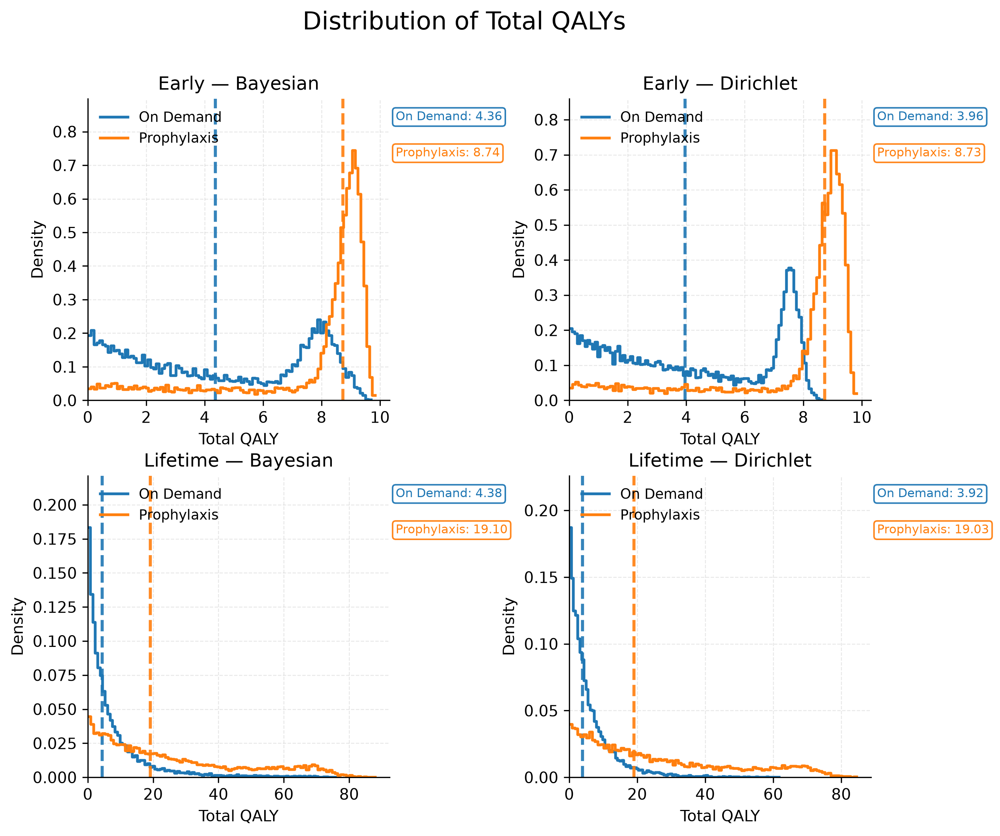

WindowsPath('C:/Users/Jino/Desktop/University/hemophilia/markov-chain-3-14/app/outputs/figures/psa_analysis/qaly_distribution.png')

In [34]:
# QALY DISTRIBUTION


@apply_grid(
    row_name="time_horizon",
    col_name="sampling_method",
    row_values=["early", "lifetime"],
    col_values=["bayesian", "dirichlet"],
    dataframe=df.filter(~pl.col("extension").is_not_null()),
    title_formatter=lambda r, c: f"{r.capitalize()} — {c.capitalize()}",
)
def plot_qaly_distribution(
    ax,
    sub,
    row_value,
    col_value,
    **kwargs,
):

    stats_text = []

    for regime, color in palette.items():

        sub_r = sub.filter(pl.col("regime") == regime)
        median_qaly = sub_r["total_qaly"].median()

        stats_text.append(
            (
                f"{regime.replace('-', ' ').title()}: " f"{median_qaly:.2f}",
                color,
            )
        )

        sns.histplot(
            data=sub_r,
            x="total_qaly",
            bins=100,
            stat="density",
            element="step",
            fill=False,
            common_norm=False,
            linewidth=1.8,
            color=color,
            ax=ax,
            label=regime.replace("-", " ").title(),
        )

        ax.axvline(
            median_qaly,
            color=color,
            linestyle="--",
            linewidth=2,
            alpha=0.9,
        )

    text_y = 0.96

    for text, color in stats_text:

        ax.text(
            1.02,  # outside right side
            text_y,
            text,
            transform=ax.transAxes,
            ha="left",
            va="top",
            fontsize=8,
            color=color,
            bbox=dict(
                facecolor="white",
                edgecolor=color,
                alpha=0.95,
                boxstyle="round,pad=0.25",
            ),
        )

        text_y -= 0.12

    ax.set_xlim(left=0)

    ymin, ymax = ax.get_ylim()
    ax.set_ylim(ymin, ymax * 1.15)

    ax.set_xlabel("Total QALY")
    ax.set_ylabel("Density")

    ax.grid(
        alpha=0.2,
        linestyle="--",
        linewidth=0.6,
    )

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    ax.legend(
        frameon=False,
        fontsize=9,
        loc="upper left",
    )


fig, axes = plot_qaly_distribution()

fig.suptitle(
    "Distribution of Total QALYs",
    fontsize=16,
)

plt.show()
save_plot(fig, "qaly_distribution.png")

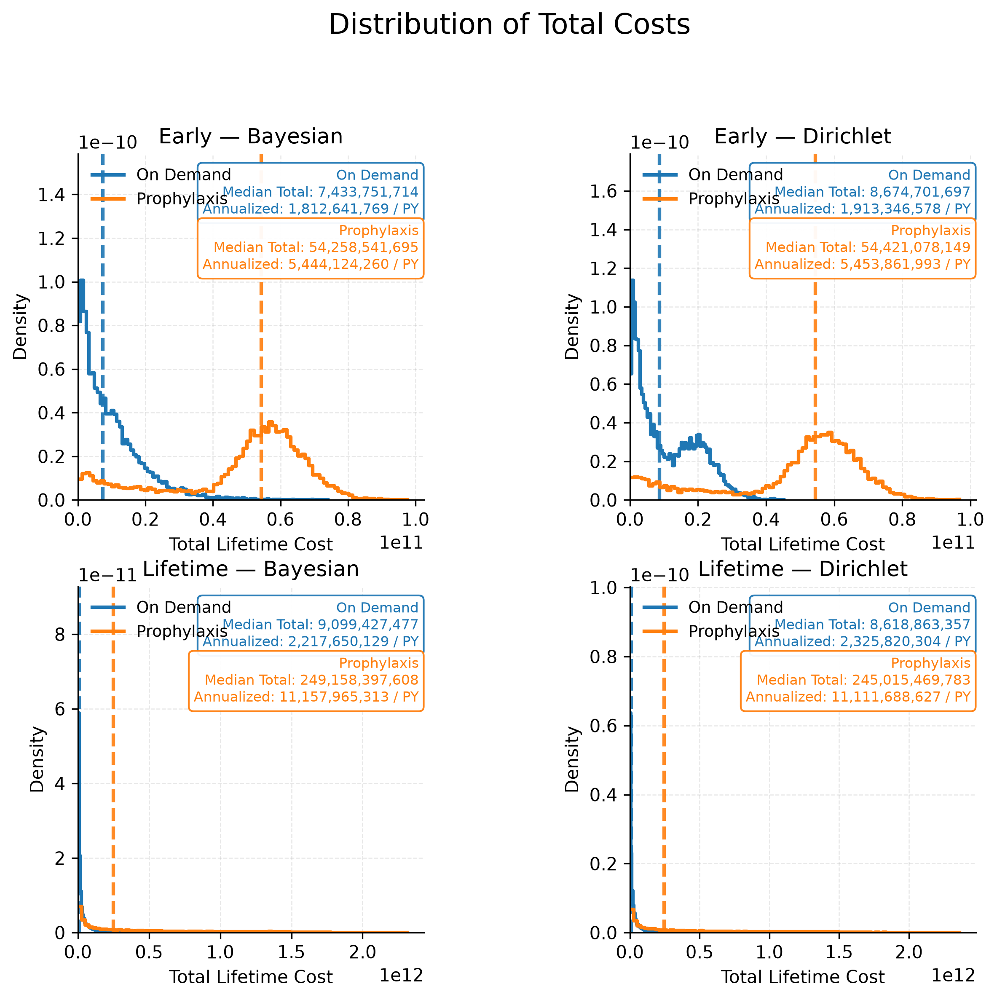

WindowsPath('C:/Users/Jino/Desktop/University/hemophilia/markov-chain-3-14/app/outputs/figures/psa_analysis/cost_distribution.png')

In [35]:
# COST DISTRIBUTION


@apply_grid(
    row_values=["early", "lifetime"],
    col_values=["bayesian", "dirichlet"],
    row_name="time_horizon",
    col_name="sampling_method",
    dataframe=df.filter(~pl.col("extension").is_not_null()),
    title_formatter=lambda r, c: f"{r.capitalize()} — {c.capitalize()}",
)
def plot_cost_distribution(
    ax,
    sub,
    row_value,
    col_value,
    **kwargs,
):

    annotation_y = [0.96, 0.80]
    for idx, (regime, color) in enumerate(palette.items()):

        sub_r = sub.filter(pl.col("regime") == regime)

        median_total_cost = sub_r["total_cost"].median()
        annualized_cost = (sub_r["total_cost"] / sub_r["person_years"]).mean()

        sns.histplot(
            data=sub_r,
            x="total_cost",
            bins=90,
            stat="density",
            element="step",
            fill=False,
            common_norm=False,
            linewidth=2,
            color=color,
            ax=ax,
            label=regime.replace("-", " ").title(),
        )

        # Median line
        ax.axvline(
            median_total_cost,
            color=color,
            linestyle="--",
            linewidth=2,
            alpha=0.9,
        )

        # Annotation
        ax.text(
            0.985,
            annotation_y[idx],
            (
                f"{regime.replace('-', ' ').title()}\n"
                f"Median Total: {median_total_cost:,.0f}\n"
                f"Annualized: {annualized_cost:,.0f} / PY"
            ),
            transform=ax.transAxes,
            ha="right",
            va="top",
            fontsize=8,
            color=color,
            bbox=dict(
                facecolor="white",
                edgecolor=color,
                alpha=0.95,
                boxstyle="round,pad=0.35",
            ),
        )

    ax.set_xlim(left=0)
    ymin, ymax = ax.get_ylim()
    ax.set_ylim(ymin, ymax * 1.5)

    ax.set_xlabel("Total Lifetime Cost")
    ax.set_ylabel("Density")

    ax.grid(
        alpha=0.20,
        linestyle="--",
        linewidth=0.6,
    )

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    ax.legend(
        frameon=False,
        fontsize=9,
        loc="upper left",
    )


fig, axes = plot_cost_distribution()

fig.suptitle(
    "Distribution of Total Costs",
    fontsize=16,
    y=1.02,
)

plt.show()
save_plot(fig, "cost_distribution.png")

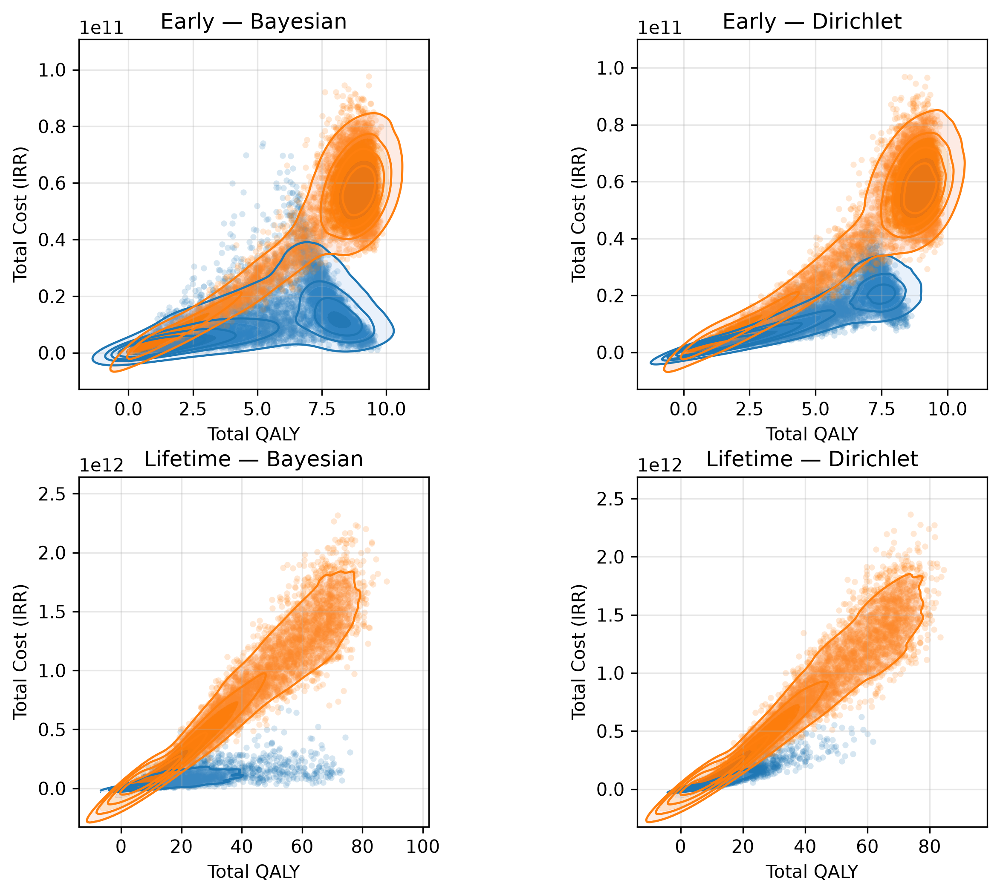

WindowsPath('C:/Users/Jino/Desktop/University/hemophilia/markov-chain-3-14/app/outputs/figures/psa_analysis/joint_cost_qaly_density.png')

In [36]:
# KDE JOINT PLOT

cost_unit = "IRR"


@apply_grid(
    row_values=["early", "lifetime"],
    col_values=["bayesian", "dirichlet"],
    row_name="time_horizon",
    col_name="sampling_method",
    dataframe=df.filter(~pl.col("extension").is_not_null()),
    title_formatter=lambda r, c: f"{r.capitalize()} — {c.capitalize()}",
)
def plot_joint_density(
    ax,
    sub,
    row_value,
    col_value,
    **kwargs,
):
    horizon = row_value
    dist = col_value

    for regime, color in palette.items():

        sub_r = sub.filter(pl.col("regime") == regime)

        # Scatter
        sns.scatterplot(
            data=sub_r,
            x="total_qaly",
            y="total_cost",
            ax=ax,
            color=color,
            s=12,
            alpha=0.18,
            edgecolor=None,
            linewidth=0,
            rasterized=True,
        )

        # Filled KDE
        sns.kdeplot(
            data=sub_r,
            x="total_qaly",
            y="total_cost",
            ax=ax,
            fill=True,
            levels=4,
            thresh=0.05,
            alpha=0.22,
            color=color,
            bw_adjust=1,
        )

        # KDE outlines
        sns.kdeplot(
            data=sub_r,
            x="total_qaly",
            y="total_cost",
            ax=ax,
            fill=False,
            levels=5,
            linewidths=1.2,
            color=color,
            bw_adjust=1,
        )

    ax.set_xlabel("Total QALY")
    ax.set_ylabel(f"Total Cost ({kwargs['cost_unit']})")


fig, axes = plot_joint_density(cost_unit=cost_unit)
plt.show()
save_plot(fig, "joint_cost_qaly_density.png")

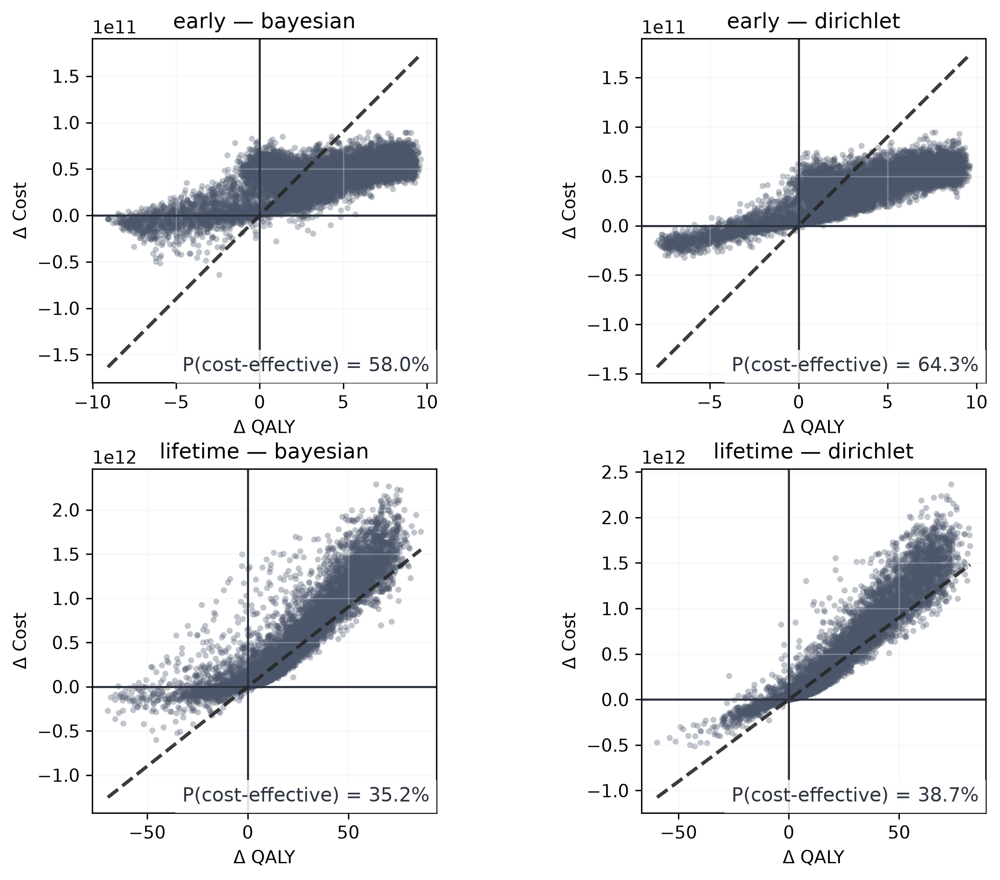

WindowsPath('C:/Users/Jino/Desktop/University/hemophilia/markov-chain-3-14/app/outputs/figures/psa_analysis/cost_effectiveness_plane_grid.png')

In [37]:
# Cost-effectiveness plane with probability CE annotation

POINT_COLOR = "#4C566A"
WTP_COLOR = "#272727"
AXIS_COLOR = "#2E3440"
GRID_COLOR = "#E5E9F0"


@apply_grid(
    row_values=["early", "lifetime"],
    col_values=["bayesian", "dirichlet"],
    row_name="time_horizon",
    col_name="sampling_method",
    dataframe=df.filter(~pl.col("extension").is_not_null()),
)
def plot_ce_plane_grid(ax, sub, row_value, col_value, i, j):

    scenarios = sub["scenario"].unique().to_list()

    if len(scenarios) < 2:
        ax.text(0.5, 0.5, "Need ≥ 2 scenarios", ha="center", va="center")
        ax.set_axis_off()
        return

    # pin the roles by name, not by list order
    on_demand_scens = [s for s in scenarios if "on-demand" in s]
    prophylaxis_scens = [s for s in scenarios if "prophylaxis" in s]

    if not on_demand_scens or not prophylaxis_scens:

        ax.text(0.5, 0.5, "Need on-demand + prophylaxis", ha="center", va="center")
        ax.set_axis_off()

        return

    base, comp = on_demand_scens[0], prophylaxis_scens[0]

    base_df = sub.filter(pl.col("scenario") == base).select(
        "iteration_id",
        pl.col("total_cost").alias("base_cost"),
        pl.col("total_qaly").alias("base_qaly"),
    )
    comp_df = sub.filter(pl.col("scenario") == comp).select(
        "iteration_id",
        pl.col("total_cost").alias("comp_cost"),
        pl.col("total_qaly").alias("comp_qaly"),
    )

    paired = base_df.join(
        comp_df, on="iteration_id", how="inner", validate="1:1"
    ).with_columns(
        (pl.col("comp_cost") - pl.col("base_cost")).alias("delta_cost"),
        (pl.col("comp_qaly") - pl.col("base_qaly")).alias("delta_qaly"),
    ).with_columns(
        (pl.col("delta_qaly") * WTP - pl.col("delta_cost")).alias("delta_nmb")
    )

    if paired.height != base_df.height or paired.height != comp_df.height:
        raise ValueError(
            f"Incomplete iteration pairing for {comp} vs {base}: "
            f"base={base_df.height}, comp={comp_df.height}, paired={paired.height}"
        )

    delta_cost = paired["delta_cost"].to_numpy()
    delta_qaly = paired["delta_qaly"].to_numpy()
    delta_nmb = paired["delta_nmb"].to_numpy()

    prob_ce = float((delta_nmb > 0).mean())

    ax.scatter(
        delta_qaly,
        delta_cost,
        alpha=0.35,
        s=12,
        color=POINT_COLOR,
        edgecolor="none",
    )

    ax.axhline(0, linewidth=1.2, color=AXIS_COLOR)
    ax.axvline(0, linewidth=1.2, color=AXIS_COLOR)

    x = np.linspace(delta_qaly.min(), delta_qaly.max(), 100)
    ax.plot(
        x,
        x * WTP,
        linestyle="--",
        linewidth=2,
        color=WTP_COLOR,
        alpha=0.9,
    )

    ax.grid(True, color=GRID_COLOR, linewidth=0.8)

    ax.set_xlabel("Δ QALY")
    ax.set_ylabel("Δ Cost")
    ax.set_title(f"{row_value} | {col_value}\n{comp} vs {base}")

    ax.text(
        0.98,
        0.02,
        f"P(cost-effective) = {prob_ce:.1%}",
        transform=ax.transAxes,
        ha="right",
        va="bottom",
        fontsize=11,
        color=AXIS_COLOR,
        bbox=dict(facecolor="white", alpha=0.85, edgecolor="none"),
    )


fig, axes = plot_ce_plane_grid()
plt.show()
save_plot(fig, "cost_effectiveness_plane_grid.png")

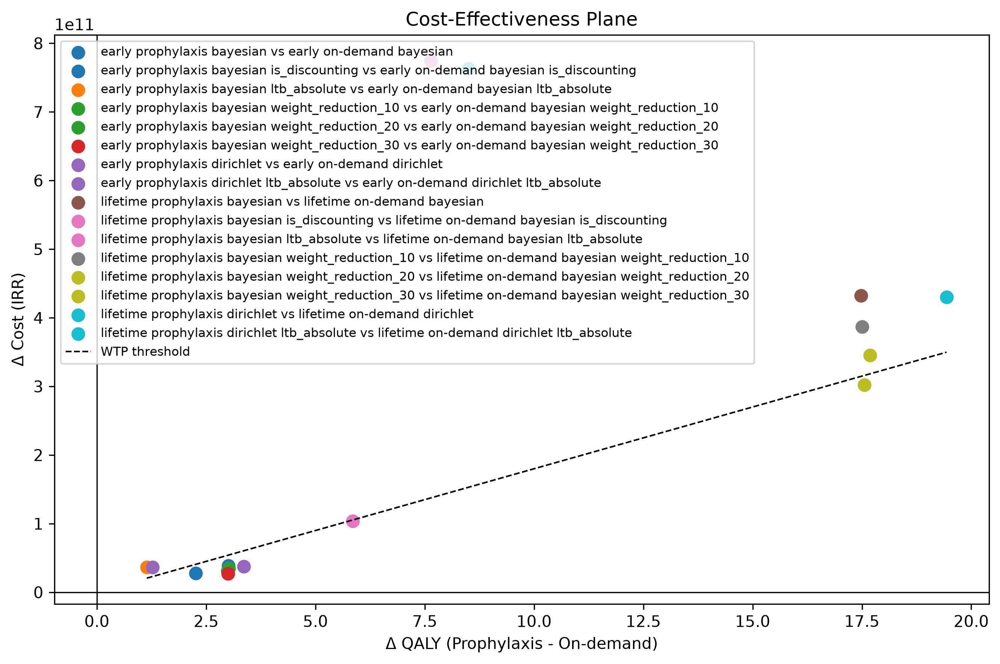

WindowsPath('C:/Users/Jino/Desktop/University/hemophilia/markov-chain-3-14/app/outputs/figures/psa_analysis/combined_cost_effectiveness_plane.png')

In [38]:
# Combined CE plane with all comparisons and WTP threshold

fig, ax = plt.subplots(figsize=(9, 6))

colors = plt.cm.tab10(np.linspace(0, 1, len(icer_nmb_df)))  # type: ignore

for i, row in enumerate(icer_nmb_df.iter_rows(named=True)):
    ax.scatter(
        row["Δ QALY"], row["Δ cost"], color=colors[i], s=60, label=row["comparison"]
    )

# WTP threshold line
x_vals = np.linspace(icer_nmb_df["Δ QALY"].min(), icer_nmb_df["Δ QALY"].max(), 200)  # type: ignore

ax.plot(x_vals, x_vals * WTP, "--", color="black", linewidth=1, label="WTP threshold")

ax.axhline(0, color="black", linewidth=0.8)
ax.axvline(0, color="black", linewidth=0.8)

ax.set_xlabel("Δ QALY (Prophylaxis - On-demand)")
ax.set_ylabel(f"Δ Cost ({cost_unit})")
ax.set_title("Cost-Effectiveness Plane")

ax.legend(fontsize=8, frameon=True)

plt.tight_layout()
plt.show()
save_plot(fig, "combined_cost_effectiveness_plane.png")

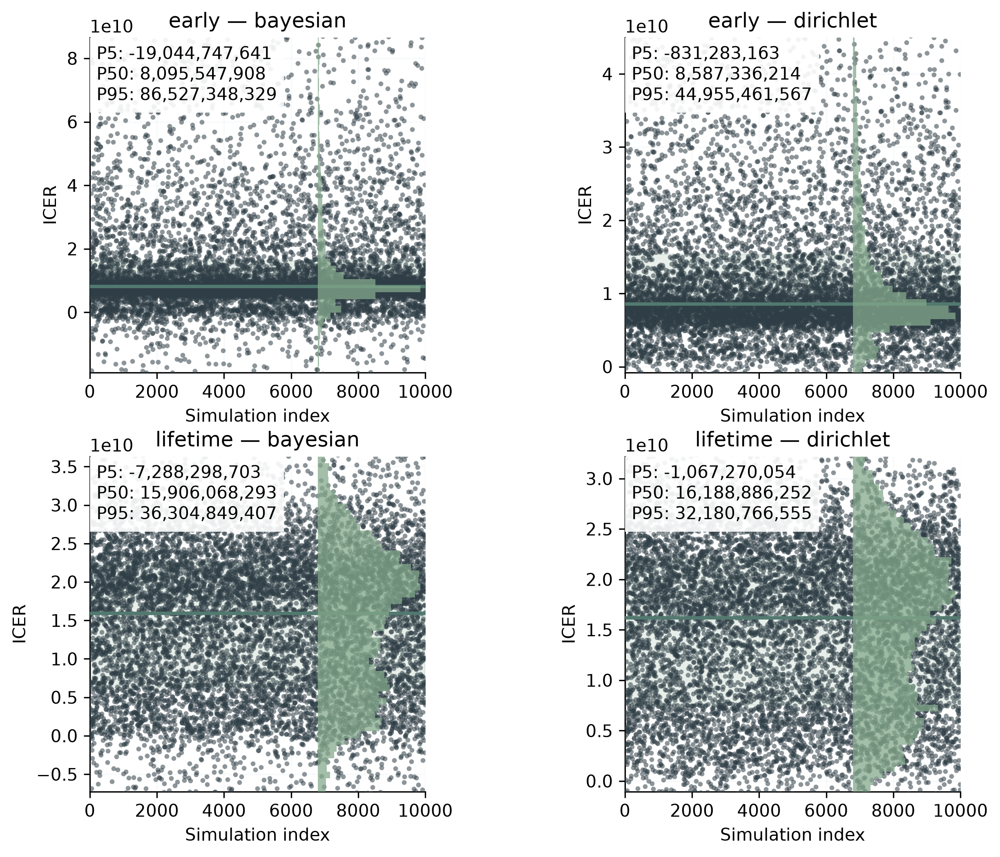

WindowsPath('C:/Users/Jino/Desktop/University/hemophilia/markov-chain-3-14/app/outputs/figures/psa_analysis/icer_distribution_grid.png')

In [39]:
# ICER DISTRIBUTION WITH INSET HISTOGRAM

BLUE = "#2F3E46"
EDGE = "#52796F"
HIST = "#84A98C"
GRID = "#E9ECEF"


@apply_grid(
    row_values=["early", "lifetime"],
    col_values=["bayesian", "dirichlet"],
    row_name="time_horizon",
    col_name="sampling_method",
    dataframe=df.filter(~pl.col("extension").is_not_null()),
)
def plot_icer_distribution(ax, sub, row_value, col_value, i, j):

    scenarios = sub["scenario"].unique().to_list()

    if len(scenarios) < 2:
        ax.text(0.5, 0.5, "Need ≥ 2 scenarios", ha="center", va="center")
        ax.set_axis_off()
        return

    # pin the roles by name, not by list order
    on_demand_scens = [s for s in scenarios if "on-demand" in s]
    prophylaxis_scens = [s for s in scenarios if "prophylaxis" in s]

    if not on_demand_scens or not prophylaxis_scens:

        ax.text(0.5, 0.5, "Need on-demand + prophylaxis", ha="center", va="center")
        ax.set_axis_off()

        return

    base, comp = on_demand_scens[0], prophylaxis_scens[0]

    base_df = sub.filter(pl.col("scenario") == base)
    comp_df = sub.filter(pl.col("scenario") == comp)

    dc = (comp_df["total_cost"] - base_df["total_cost"]).to_numpy()
    dq = (comp_df["total_qaly"] - base_df["total_qaly"]).to_numpy()

    valid = np.isfinite(dc) & np.isfinite(dq) & (dq != 0)
    icer = dc[valid] / dq[valid]

    if icer.size == 0:
        ax.text(0.5, 0.5, "No valid ICERs", ha="center", va="center")
        ax.set_axis_off()
        return

    q5, q25, q50, q75, q95 = np.percentile(icer, [5, 25, 50, 75, 95])
    clipped = icer[(icer >= q5) & (icer <= q95)]

    x = np.arange(len(icer))

    ax.scatter(x, icer, s=8, color=BLUE, alpha=0.55, linewidths=0, zorder=3)

    ax.axhspan(q25, q75, color=HIST, alpha=0.18, zorder=1)
    ax.axhline(q50, color=EDGE, linewidth=2.0, zorder=4)

    ax.set_xlim(0, len(icer))
    ax.set_ylim(q5, q95)

    ax.set_xlabel("Simulation index")
    ax.set_ylabel("ICER")
    ax.set_title(f"{row_value} | {col_value}\n{comp} vs {base}", pad=10)

    ax.grid(True, color=GRID, linewidth=0.8, alpha=0.6)
    ax.set_axisbelow(True)

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    hist_ax = inset_axes(
        ax,
        width="32%",
        height="100%",
        loc="upper right",
        borderpad=0,
    )

    hist_ax.hist(
        clipped,
        bins=50,
        orientation="horizontal",
        color=HIST,
        alpha=0.75,
        edgecolor="none",
    )

    hist_ax.set_ylim(ax.get_ylim())

    hist_ax.set_xticks([])
    hist_ax.set_yticks([])
    hist_ax.set_frame_on(False)

    ax.text(
        0.02,
        0.98,
        f"P5: {q5:,.0f}\nP50: {q50:,.0f}\nP95: {q95:,.0f}",
        transform=ax.transAxes,
        va="top",
        ha="left",
        fontsize=10,
        bbox=dict(facecolor="white", edgecolor="none", alpha=0.9),
    )


fig, axes = plot_icer_distribution()
plt.show()
save_plot(fig, "icer_distribution_grid.png")

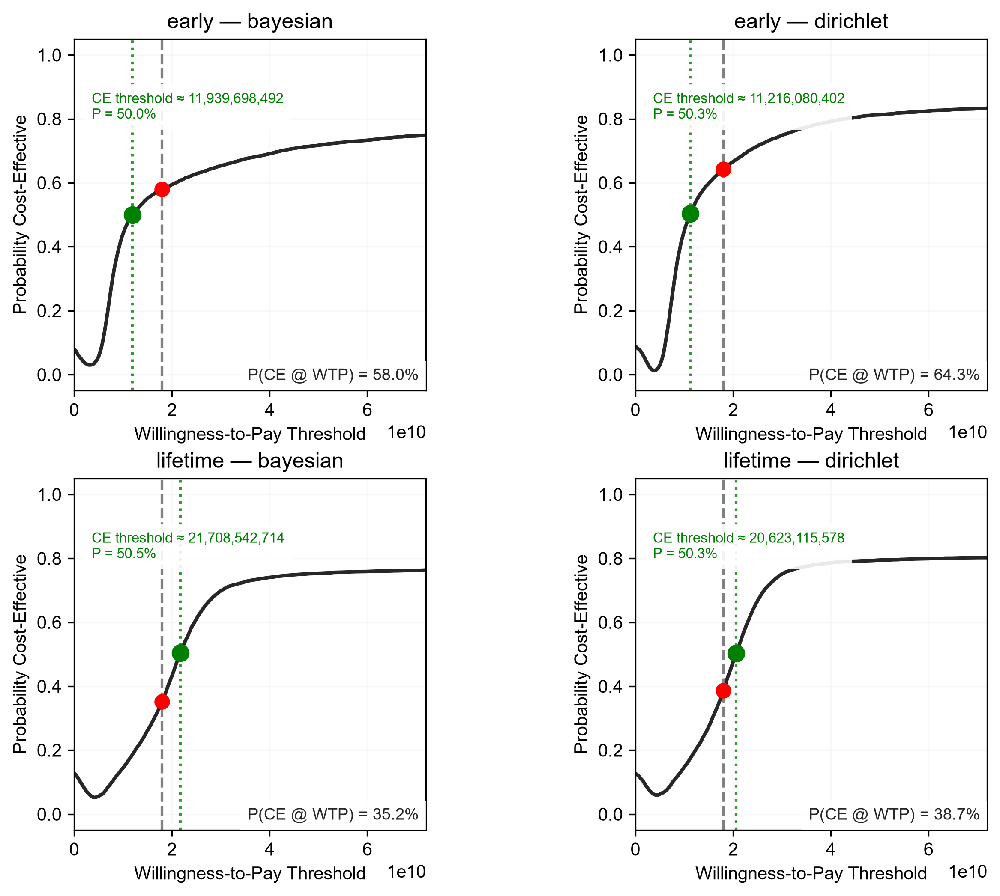

WindowsPath('C:/Users/Jino/Desktop/University/hemophilia/markov-chain-3-14/app/outputs/figures/psa_analysis/ceac_grid.png')

In [40]:
# CEAC PLOT WITH THRESHOLD ANNOTATION

POINT_COLOR = "#4C566A"
LINE_COLOR = "#272727"
GRID_COLOR = "#E5E9F0"


@apply_grid(
    row_values=["early", "lifetime"],
    col_values=["bayesian", "dirichlet"],
    row_name="time_horizon",
    col_name="sampling_method",
    dataframe=df.filter(~pl.col("extension").is_not_null()),
)
def plot_ceac_grid(ax, sub, row_value, col_value, i, j):

    scenarios = sub["scenario"].unique().to_list()

    if len(scenarios) < 2:
        ax.text(0.5, 0.5, "Need ≥ 2 scenarios", ha="center", va="center")
        ax.set_axis_off()
        return

    # pin the roles by name, not by list order
    on_demand_scens = [s for s in scenarios if "on-demand" in s]
    prophylaxis_scens = [s for s in scenarios if "prophylaxis" in s]

    if not on_demand_scens or not prophylaxis_scens:

        ax.text(0.5, 0.5, "Need on-demand + prophylaxis", ha="center", va="center")
        ax.set_axis_off()

        return

    base, comp = on_demand_scens[0], prophylaxis_scens[0]

    base_df = sub.filter(pl.col("scenario") == base)
    comp_df = sub.filter(pl.col("scenario") == comp)

    max_threshold = WTP * 4
    X = np.linspace(0, max_threshold, 200)

    Y = []

    for wtp in X:
        nmb_base = base_df["total_qaly"] * wtp - base_df["total_cost"]
        nmb_comp = comp_df["total_qaly"] * wtp - comp_df["total_cost"]
        prob_ce = (nmb_comp.to_numpy() > nmb_base.to_numpy()).mean()
        Y.append(prob_ce)

    Y = np.array(Y)

    crossing_idx = np.where(Y >= 0.5)[0]

    if len(crossing_idx) > 0:
        ce_threshold = X[crossing_idx[0]]
        ce_prob_at_threshold = Y[crossing_idx[0]]
    else:
        ce_threshold = None

    nmb_base_wtp = base_df["total_qaly"] * WTP - base_df["total_cost"]
    nmb_comp_wtp = comp_df["total_qaly"] * WTP - comp_df["total_cost"]

    current_prob = (nmb_comp_wtp.to_numpy() > nmb_base_wtp.to_numpy()).mean()

    sns.set_theme(style="whitegrid")

    ax.plot(X, Y, linewidth=2, color=LINE_COLOR)

    ax.axvline(WTP, color="gray", linestyle="--", linewidth=1.5)

    ax.scatter(WTP, current_prob, color="red", s=60, zorder=5)

    if ce_threshold is not None:

        ax.scatter(
            ce_threshold,
            ce_prob_at_threshold,  # type: ignore
            color="green",
            s=80,
            zorder=6,
        )

        ax.axvline(
            ce_threshold,
            color="green",
            linestyle=":",
            linewidth=1.5,
            alpha=0.8,
        )

        ax.annotate(
            f"CE threshold ≈ {ce_threshold:,.0f}\nP = {ce_prob_at_threshold:.1%}",  # type: ignore
            xy=(ce_threshold, ce_prob_at_threshold),  # type: ignore
            xytext=(0.05, 0.85),
            textcoords="axes fraction",
            fontsize=8,
            color="green",
            bbox=dict(facecolor="white", alpha=0.9, edgecolor="none"),
            ha="left",
            va="top",
        )

    ax.set_xlabel("Willingness-to-Pay Threshold")
    ax.set_ylabel("Probability Cost-Effective")
    ax.set_title(f"{row_value} | {col_value}\n{comp} vs {base}")

    ax.set_xlim(0, max_threshold)
    ax.set_ylim(-0.05, 1.05)

    ax.grid(True, color=GRID_COLOR, linewidth=0.8)

    ax.text(
        0.98,
        0.02,
        f"P(CE @ WTP) = {current_prob:.1%}",
        transform=ax.transAxes,
        ha="right",
        va="bottom",
        fontsize=9,
        bbox=dict(facecolor="white", alpha=0.85, edgecolor="none"),
    )


fig, axes = plot_ceac_grid()
plt.show()
save_plot(fig, "ceac_grid.png")

ICER ANALYSIS: early prophylaxis bayesian vs early on-demand bayesian
WTP                        : 18,000,000,000
Baseline ABR (on-demand)   : 22.58
No cost-effective threshold found within observed range.
Best parametric model      : logistic (R^2 = 0.9963, AIC = 3883.8)
ICER ANALYSIS: early prophylaxis bayesian is_discounting vs early on-demand bayesian is_discounting
WTP                        : 18,000,000,000
Baseline ABR (on-demand)   : 22.58
No cost-effective threshold found within observed range.
Best parametric model      : logistic (R^2 = 0.9962, AIC = 3891.0)
ICER ANALYSIS: early prophylaxis bayesian ltb_absolute vs early on-demand bayesian ltb_absolute
WTP                        : 18,000,000,000
Baseline ABR (on-demand)   : 22.58
Cost-effective ABR*        : 17.69
ABR headroom over CE       : 4.89 (typical OD above threshold)
Best parametric model      : logistic (R^2 = 0.9974, AIC = 4212.9)
ICER ANALYSIS: early prophylaxis bayesian weight_reduction_10 vs early on-demand bay

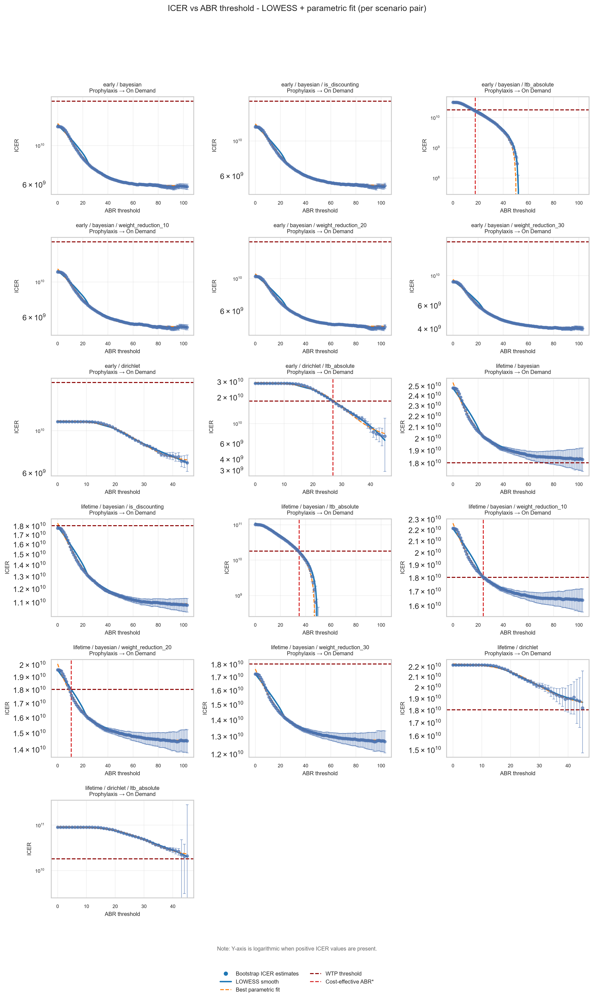

In [41]:
# ICER ANALYSIS WITH PARAMETRIC FITTING + THRESHOLD
# Rendered as a 4x3 grid (one panel per scenario pair) so the whole
# analysis fits on a single notebook page.

from pathlib import Path

from matplotlib.lines import Line2D


def _short_pair_label(od: str, pro: str) -> str:
    """Compact 2-line label for a pair of scenario names.

    The two scenarios differ only in the regime token (e.g.
    ``on-demand`` vs ``prophylaxis``); every other token is
    shared. Return the common tokens on the first line and the
    regime transition on the second.
    """
    od_parts = od.split()
    pro_parts = pro.split()
    common = [p for p, q in zip(od_parts, pro_parts) if p == q]
    common_str = " / ".join(common)
    od_regime = od_parts[1].replace("-", " ").title() if len(od_parts) > 1 else ""
    pro_regime = pro_parts[1].replace("-", " ").title() if len(pro_parts) > 1 else ""
    return f"{common_str}\n{pro_regime} → {od_regime}"


def _slugify(value: str) -> str:
    return value.lower().replace(" ", "_").replace("/", "_").replace("-", "_")


def _build_legend_handles(has_model: bool = False, abr_star_present: bool = False):
    handles = [
        Line2D(
            [0],
            [0],
            marker="o",
            linestyle="None",
            color="none",
            markerfacecolor="#1f77b4",
            markeredgecolor="#1f77b4",
            markersize=5,
            label="Bootstrap ICER estimates",
        ),
        Line2D(
            [0],
            [0],
            color="#1f77b4",
            linewidth=2.0,
            label="LOWESS smooth",
        ),
    ]

    if has_model:
        handles.append(
            Line2D(
                [0],
                [0],
                color="#ff7f0e",
                linestyle="--",
                linewidth=1.4,
                label="Best parametric fit",
            )
        )

    handles.append(
        Line2D(
            [0],
            [0],
            color="darkred",
            linestyle="--",
            linewidth=1.4,
            label="WTP threshold",
        )
    )

    if abr_star_present:
        handles.append(
            Line2D(
                [0],
                [0],
                color="#d62728",
                linestyle="--",
                linewidth=1.4,
                label="Cost-effective ABR*",
            )
        )

    return handles


def _save_pair_plot(res: dict, output_dir: Path) -> None:
    fig, ax = plt.subplots(figsize=(6, 4))

    ax.errorbar(
        res["x"],
        res["y"],
        yerr=res["yerr"],
        fmt="o",
        markersize=4,
        alpha=0.65,
        capsize=2,
        capthick=0.8,
        elinewidth=0.8,
    )

    ax.plot(
        res["x_s"],
        res["y_s"],
        linewidth=2.0,
        color="#1f77b4",
        label="LOWESS",
    )

    if res["best_model"]:
        name, m = res["best_model"]
        ax.plot(
            res["x_s"],
            m["curve"],
            linestyle="--",
            linewidth=1.4,
            color="#ff7f0e",
            label=f"{name}",
        )

    ax.axhline(
        WTP,
        linestyle="--",
        linewidth=1.4,
        color="darkred",
    )

    if res["abr_star"] is not None:
        ax.axvline(
            res["abr_star"],
            linestyle="--",
            linewidth=1.4,
            color="#d62728",
        )

    ax.set_title(
        _short_pair_label(res["od_name"], res["pro_name"]),
        fontsize=9,
        wrap=True,
    )

    positive_y = np.isfinite(res["y"]) & (res["y"] > 0)
    uses_log_scale = bool(np.any(positive_y))
    ax.set_yscale("log" if uses_log_scale else "linear")

    ax.set_xlabel("ABR threshold", fontsize=8)
    ax.set_ylabel("ICER", fontsize=8)
    ax.tick_params(labelsize=7)
    ax.grid(True, alpha=0.25)

    if uses_log_scale:
        ax.text(
            0.02,
            0.98,
            "Y-axis: log scale",
            transform=ax.transAxes,
            ha="left",
            va="top",
            fontsize=7,
            color="dimgray",
            bbox=dict(facecolor="white", alpha=0.75, edgecolor="none"),
        )

    legend_handles = _build_legend_handles(
        has_model=bool(res["best_model"]),
        abr_star_present=res["abr_star"] is not None,
    )
    ax.legend(
        handles=legend_handles,
        loc="best",
        frameon=False,
        fontsize=7,
    )

    fig.tight_layout()
    fig.savefig(
        output_dir
        / f"icer_pair_{_slugify(res['od_name'])}_vs_{_slugify(res['pro_name'])}.png",
        dpi=300,
        bbox_inches="tight",
    )
    plt.close(fig)


# PARAMETRIC MODELS
def sat_exp(x, a, b, c):
    """Saturating exponential model"""
    return a * (1 - np.exp(-b * x)) + c


def logistic(x, L, k, x0, c):
    """Logistic / sigmoidal model"""
    return L / (1 + np.exp(-k * (x - x0))) + c


# METRICS
def r2_score(y, yhat):
    ss_res = np.sum((y - yhat) ** 2)
    ss_tot = np.sum((y - np.mean(y)) ** 2)
    return 1 - (ss_res / ss_tot)


def aic(y, yhat, k):
    n = len(y)
    rss = np.sum((y - yhat) ** 2)
    return n * np.log(rss / n + 1e-12) + 2 * k


def bootstrap_icer(od: pl.DataFrame, pro: pl.DataFrame, B: int = 2000, seed: int = 42):
    """Bootstrap ICER estimator"""
    np.random.seed(seed)
    n = min(len(od), len(pro))
    icers = np.full(B, np.nan)

    od_cost = od["total_cost"].sum()
    od_qaly = od["total_qaly"].sum()
    pro_cost = pro["total_cost"].to_numpy()
    pro_qaly = pro["total_qaly"].to_numpy()

    for i in range(B):
        idx = np.random.randint(0, len(pro), size=n)
        d_cost = pro_cost[idx].sum() - od_cost
        d_qaly = pro_qaly[idx].sum() - od_qaly
        if abs(d_qaly) > 1e-9:
            icers[i] = d_cost / d_qaly

    return np.nanmean(icers), np.nanstd(icers)


def find_threshold(x, y, wtp):
    """Find x where curve crosses WTP (linear interpolation)"""
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    wtp = float(wtp)

    diff = y - wtp
    sign_changes = np.where(np.diff(np.sign(diff)))[0]

    if len(sign_changes) == 0:
        return None

    i = sign_changes[0]
    x0, x1 = float(x[i]), float(x[i + 1])
    y0, y1 = float(y[i]), float(y[i + 1])

    if y1 == y0:
        return None

    return x0 + (wtp - y0) * (x1 - x0) / (y1 - y0)


# Pre-compute results for every pair, then plot a single 4x3 grid.
pair_results = []
out_dir = root / "app" / "outputs" / "figures" / "icer_analysis"
out_dir.mkdir(parents=True, exist_ok=True)

for od_name, pro_name in pairs:
    od_df = df.filter(pl.col("scenario") == od_name)
    pro_df = df.filter(pl.col("scenario") == pro_name)

    if od_df.is_empty() or pro_df.is_empty():
        print(f"Skipping {od_name} vs {pro_name}: no data")
        continue

    print("=" * 90)
    print(f"ICER ANALYSIS: {pro_name} vs {od_name}")
    print("=" * 90)

    max_abr = int(od_df["sampled_abr"].max() or 0)  # type: ignore
    icer_mean = {}
    icer_std = {}

    for t in range(max_abr + 1):
        od_sel = od_df.filter(pl.col("sampled_abr") >= t)
        if len(od_sel) < 5:
            continue

        mean_icer, std_icer = bootstrap_icer(od_sel, pro_df, B=2000, seed=42 + t)
        icer_mean[t] = mean_icer
        icer_std[t] = std_icer

    if len(icer_mean) < 6:
        print("Not enough data points for robust analysis.")
        continue

    x = np.array(list(icer_mean.keys()))
    y = np.array(list(icer_mean.values()))
    yerr = np.array(list(icer_std.values()))

    ma = np.isfinite(y)
    x, y, yerr = x[ma], y[ma], yerr[ma]

    lowess_curve = lowess(y, x, frac=0.35, return_sorted=True)
    x_s = lowess_curve[:, 0]
    y_s = lowess_curve[:, 1]

    models = {}
    try:
        p0 = [np.max(y), 0.05, np.min(y)]
        params, _ = curve_fit(sat_exp, x, y, p0=p0, maxfev=20000)
        yhat = sat_exp(x, *params)
        models["sat_exp"] = {
            "params": params,
            "r2": r2_score(y, yhat),
            "aic": aic(y, yhat, k=3),
            "curve": sat_exp(x_s, *params),
        }
    except Exception:
        pass

    p0 = [-(np.max(y) - np.min(y)), 0.1, np.median(x), np.max(y)]
    params, _ = curve_fit(logistic, x, y, p0=p0, maxfev=20000)
    yhat = logistic(x, *params)
    models["logistic"] = {
        "params": params,
        "r2": r2_score(y, yhat),
        "aic": aic(y, yhat, k=4),
        "curve": logistic(x_s, *params),
    }
    abr_star = find_threshold(x_s, y_s, WTP)
    baseline_abr = float(od_df["sampled_abr"].mean() or 0.0)  # type: ignore
    abr_margin = None if abr_star is None else baseline_abr - float(abr_star)
    best_model = None
    if models:
        best_model = min(models.items(), key=lambda item: item[1]["aic"])

    print(f"WTP                        : {WTP:,.0f}")
    print(f"Baseline ABR (on-demand)   : {baseline_abr:.2f}")
    if abr_star is not None and abr_margin is not None:
        print(f"Cost-effective ABR*        : {abr_star:.2f}")
        if abr_margin >= 0:
            print(
                f"ABR headroom over CE       : {abr_margin:.2f} (typical OD above threshold)"
            )
        else:
            print(
                f"ABR shortfall to CE        : {abs(abr_margin):.2f} (typical OD below threshold)"
            )
    else:
        print("No cost-effective threshold found within observed range.")

    if best_model:
        name, res = best_model
        print(
            f"Best parametric model      : {name} (R^2 = {res['r2']:.4f}, AIC = {res['aic']:.1f})"
        )

    pair_results.append(
        {
            "od_name": od_name,
            "pro_name": pro_name,
            "x": x,
            "y": y,
            "yerr": yerr,
            "x_s": x_s,
            "y_s": y_s,
            "best_model": best_model,
            "abr_star": abr_star,
            "baseline_abr": baseline_abr,
            "abr_margin": abr_margin,
        }
    )

    _save_pair_plot(pair_results[-1], out_dir)

# 4x3 grid (or as close as needed). 12 pairs is the typical size but
# fall back to a smaller grid if fewer pairs produced results.
n_pairs = len(pair_results)
if n_pairs == 0:
    print("No pairs to plot.")
else:
    n_cols = 3 if n_pairs >= 9 else (2 if n_pairs >= 4 else 1)
    n_rows = (n_pairs + n_cols - 1) // n_cols

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(4.0 * n_cols, 3.4 * n_rows),
        squeeze=False,
    )

    for k, res in enumerate(pair_results):
        ax = axes[k // n_cols][k % n_cols]

        ax.errorbar(
            res["x"],
            res["y"],
            yerr=res["yerr"],
            fmt="o",
            markersize=4,
            alpha=0.65,
            capsize=2,
            capthick=0.8,
            elinewidth=0.8,
        )

        ax.plot(
            res["x_s"],
            res["y_s"],
            linewidth=2.0,
            color="#1f77b4",
            label="LOWESS",
        )

        if res["best_model"]:
            name, m = res["best_model"]
            ax.plot(
                res["x_s"],
                m["curve"],
                linestyle="--",
                linewidth=1.4,
                color="#ff7f0e",
                label=f"{name}",
            )

        ax.axhline(
            WTP,
            linestyle="--",
            linewidth=1.4,
            color="darkred",
        )

        if res["abr_star"] is not None:
            ax.axvline(
                res["abr_star"],
                linestyle="--",
                linewidth=1.4,
                color="#d62728",
            )

        # Compact 2-line subplot title (was: full scenario name pair)
        ax.set_title(
            _short_pair_label(res["od_name"], res["pro_name"]),
            fontsize=8,
            wrap=True,
        )

        positive_y = np.isfinite(res["y"]) & (res["y"] > 0)
        if np.any(positive_y):
            ax.set_yscale("log")
        else:
            ax.set_yscale("linear")

        ax.set_xlabel("ABR threshold", fontsize=8)
        ax.set_ylabel("ICER", fontsize=8)
        ax.tick_params(labelsize=7)
        ax.grid(True, alpha=0.25)

    # Hide any unused panels.
    for k in range(n_pairs, n_rows * n_cols):
        axes[k // n_cols][k % n_cols].set_axis_off()

    fig.suptitle(
        "ICER vs ABR threshold - LOWESS + parametric fit (per scenario pair)",
        fontsize=12,
    )

    legend_handles = _build_legend_handles(
        has_model=any(res["best_model"] for res in pair_results),
        abr_star_present=any(res["abr_star"] is not None for res in pair_results),
    )
    fig.legend(
        handles=legend_handles,
        loc="lower center",
        bbox_to_anchor=(0.5, 0.01),
        ncol=2,
        frameon=False,
        fontsize=8,
    )

    uses_log_scale = any(
        np.any(np.isfinite(res["y"]) & (res["y"] > 0)) for res in pair_results
    )
    if uses_log_scale:
        fig.text(
            0.5,
            0.055,
            "Note: Y-axis is logarithmic when positive ICER values are present.",
            ha="center",
            va="bottom",
            fontsize=8,
            color="dimgray",
        )

    fig.tight_layout(rect=(0, 0.08, 1, 0.93))
    fig.savefig(out_dir / "icer_analysis_all_pairs.png", dpi=300, bbox_inches="tight")

    plt.show()